## Reinforcement learning Project- Implement Grid World
RL is a subfield of machine learning that teaches agents to perform in an environment to maximize rewards overtime. It is basically a trial and error learning process.

Steps I have followed to create this project are
- Describe your own environment. Provide a set of actions, states, rewards, main objective, etc.
- Apply SARSA to solve your defined environment
- Provide a plot for epsilon decay
- Provide a plot for the total reward per episode.
- Run your environment for at least 10 episodes, where the agent chooses only greedy actions from the learnt policy. Plot should include the total reward per episode.
- Provide the analysis after tuning at least two hyperparameters from the list above

### Define environment
- I have created the 5 x 5 Grid world where my dog can play a smart game to reach his meal in shorter time.
- I have added few rewads in my Grid World so he can earn maximum rewards before reaching to his meal (basically a smaller path to his end goal)

If the agent(dog) gets a positive reward (Positive Reward: Bone - 10 points  & Ice Cream - 5 points , Negative Reward playing with frisby - (-5)) for an action, then it will prefer performing that action; else it will find a different action that gives a positive reward.

### SARSA vs Q-learning

SARSA algorithm is a slight variation of the popular Q-Learning algorithm. For a learning agent in any Reinforcement Learning algorithm it’s policy can be of two types:- 
 
- On Policy: In this, the learning agent learns the value function according to the current action derived from the policy currently being used.
- Off Policy: In this, the learning agent learns the value function according to the action derived from another policy.

Q-Learning technique is an Off Policy technique and uses the greedy approach to learn the Q-value. SARSA technique, on the other hand, is an On Policy and uses the action performed by the current policy to learn the Q-value.

Gym is an open source Python library for developing and comparing reinforcement learning algorithms by providing a standard API to communicate between learning algorithms and environments, as well as a standard set of environments compliant with that API

## !pip install gym 

Install this library to declare your environment

#### Importing libraries

In [2]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage, AnnotationBbox)
import gym
from gym import spaces
import random
from google.colab import widgets
import time

import warnings
warnings.filterwarnings("ignore")
import os



#### ## Using collab to pull the images

In [3]:
os.getcwd()

'/content'

#### Describe your own environment. Provide a set of actions, states, rewards, main objective, etc

In [4]:
class GridEnvironment(gym.Env):
    metadata = { 'render.modes': []}

    def __init__(self):
        # Initializes the class
        # Define action and observation space
        # Observation space is 25.
        self.observation_space = spaces.Discrete(25) 
        # There are 4 actions.
        self.action_space = spaces.Discrete(4) 
        # Max time step is 20.
        self.max_timesteps = 20
        self.env_height = 5
        self.env_width = 5

    def reset(self):
        # Resets the state of the environment to an initial state
        self.timestep = 0
        self.agent_pos = [0, 0]
        self.chicken = [4, 4]
        self.toy_bone = [0, 4]
        self.frisbee = [4, 0]
        self.icecream = [2, 2]

    def step(self, action):
        # Executes one timestep within the environment 
        # Change agent_pos
        # agent will replace others when it goes to their positions, since here we update agent to that position.
        # 0: Right; 1: Left; 2: Up; 3: Down;
        action_dic = {0: 'Right', 1: 'Left', 2: 'Up', 3: 'Down'};
        if action == 0:
            self.agent_pos[0] += 1
        if action == 1:
            self.agent_pos[0] -= 1
        if action == 2:
            self.agent_pos[1] += 1
        if action == 3:
            self.agent_pos[1] -= 1

        history_action.append(action_dic[action]) 
        
        # Limit the agent position from 0 to 4
        self.agent_pos = np.clip(self.agent_pos, 0, 4)

        # positive & negative rewards: chicken, icecream, toy_bone, frisbee
        reward = 0
        if (self.agent_pos == self.chicken).all():
            reward = 100
        elif ((self.agent_pos == self.icecream).all()):
            reward = 50
        elif ((self.agent_pos == self.toy_bone)).all():
            reward = -10
        elif ((self.agent_pos == self.frisbee)).all():
            reward = -20
            
        self.timestep += 1
        # done = True if self.timestep >= self.max_timesteps else False
        ###########
        done = True if (self.agent_pos == self.chicken).all() else False
        ###########
        # print info
        history_reward.append(reward) 
        total_reward = 0
        for ele in history_reward:
            total_reward = total_reward + ele
        info = f'Step: {len(history_action)}, \n Current action:{action_dic[action]}, \n History Action(including current action):{history_action}, \n Current reward:{reward}, \n Total reward:{total_reward}'

        return action, reward, done, info

    def render(self, mode = 'human', plot=False):
        # Visualizes the environment
        # plt.imshow(self.state)
        fig, ax = plt.subplots(figsize=(10,10))
        ax.set_xlim(0,5)
        ax.set_ylim(0,5)
        def plot_image(plot_pos):
            plot_agent, plot_goal, plot_icecream, plot_toy, plot_frisbee = False,False,False,False,False
            if np.array_equal(self.agent_pos, plot_pos):
                plot_agent = True
            if np.array_equal(self.chicken, plot_pos):
                plot_goal = True
            if np.array_equal(self.icecream, plot_pos):
                plot_icecream = True
            if np.array_equal(self.toy_bone, plot_pos):
                plot_toy = True
            if np.array_equal(self.frisbee, plot_pos):
                plot_frisbee = True
            
            if plot_agent:
                agent = AnnotationBbox(OffsetImage(plt.imread('./agent.png'), zoom = 0.09),
                                      np.add(plot_pos, [0.5,0.5]), frameon = False)
                ax.add_artist(agent)
            elif plot_goal:
                chicken = AnnotationBbox(OffsetImage(plt.imread('./chicken.png'), zoom = 0.08),
                                      np.add(plot_pos, [0.5,0.5]), frameon = False)
                ax.add_artist(chicken)
            elif plot_icecream:
                icecream = AnnotationBbox(OffsetImage(plt.imread('./icecream.png'), zoom = 0.1),
                                      np.add(plot_pos, [0.5,0.5]), frameon = False)
                ax.add_artist(icecream)
            elif plot_toy:
                toy = AnnotationBbox(OffsetImage(plt.imread('./toy_bone.png'), zoom = 0.05),
                                      np.add(plot_pos, [0.5,0.5]), frameon = False)
                ax.add_artist(toy)
            elif plot_frisbee:
                frisbee = AnnotationBbox(OffsetImage(plt.imread('./frisbee.png'), zoom = 0.25),
                                      np.add(plot_pos, [0.5,0.5]), frameon = False)
                ax.add_artist(frisbee)
                
        images = {}
        for j in range(self.env_height * self.env_width):
            images[j] = np.array([j%self.env_height, int(np.floor(j/self.env_width))])

        for position in images:
            plot_image(images[position])
        
        plt.xticks([0,1,2,3,4,5])
        plt.yticks([0,1,2,3,4,5])
        plt.grid()
        plt.show()
    
    
    

#### define an agent which is within a method choosing a step randomly

In [5]:
class Agent_Random_step:
    def __init__(self, env):
        self.env = env
        self.observation_space = env.observation_space
        self.action_space = env.action_space

    def step(self):
        return np.random.choice(self.action_space.n)

""


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

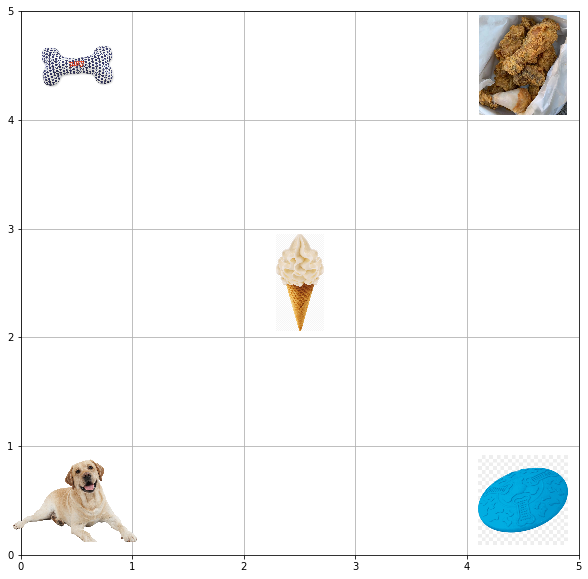

Info: Step: 1, 
 Current action:Left, 
 History Action(including current action):['Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

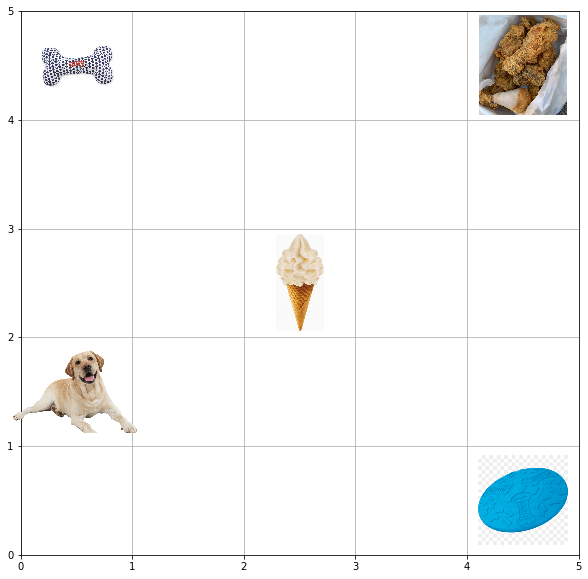

Info: Step: 2, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

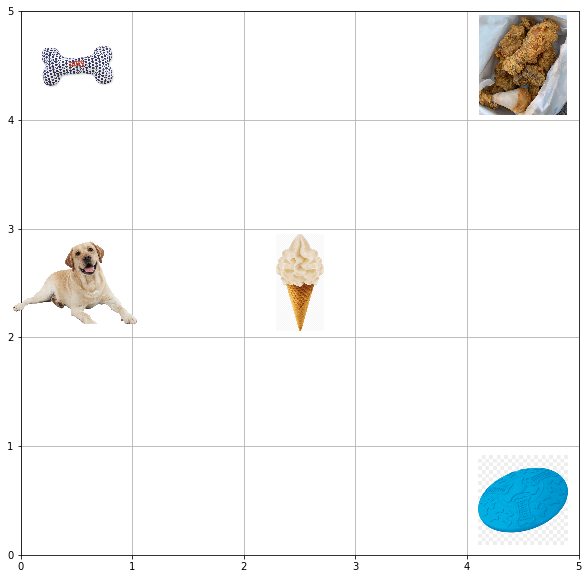

Info: Step: 3, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

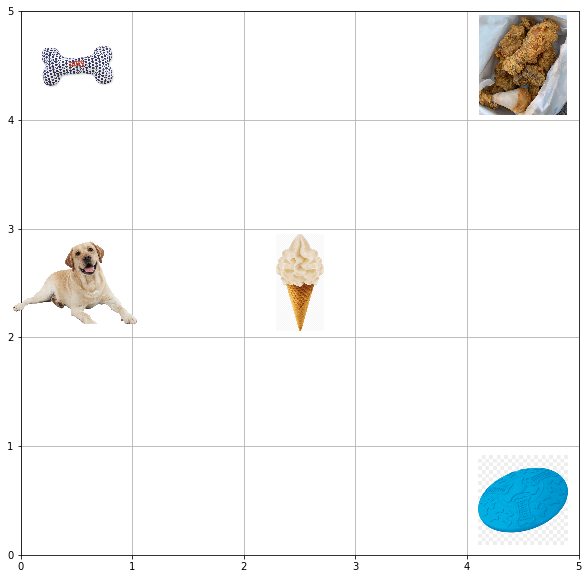

Info: Step: 4, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

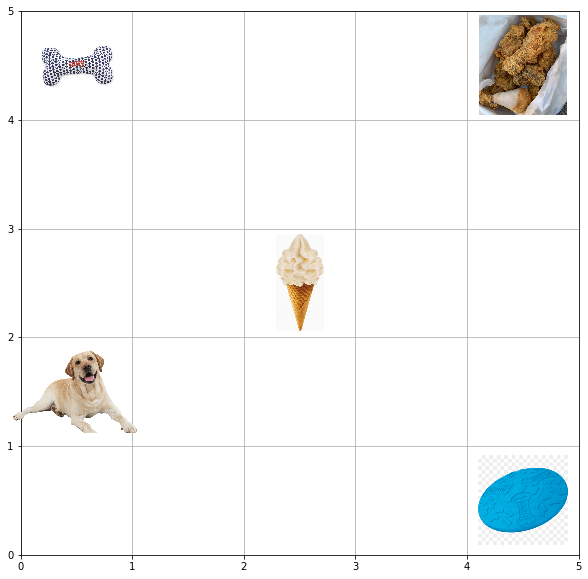

Info: Step: 5, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

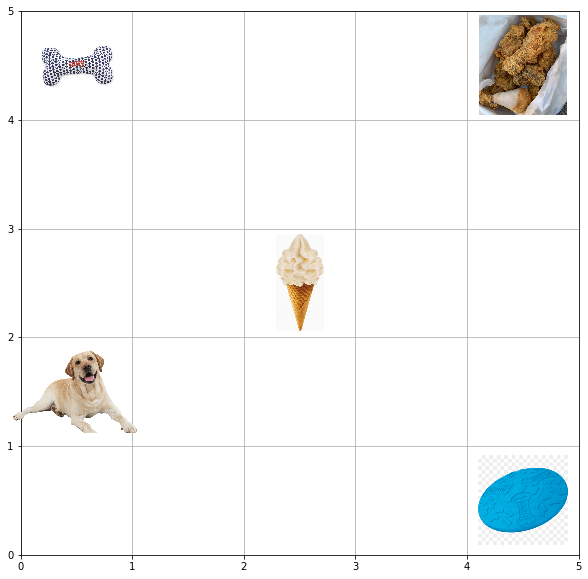

Info: Step: 6, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

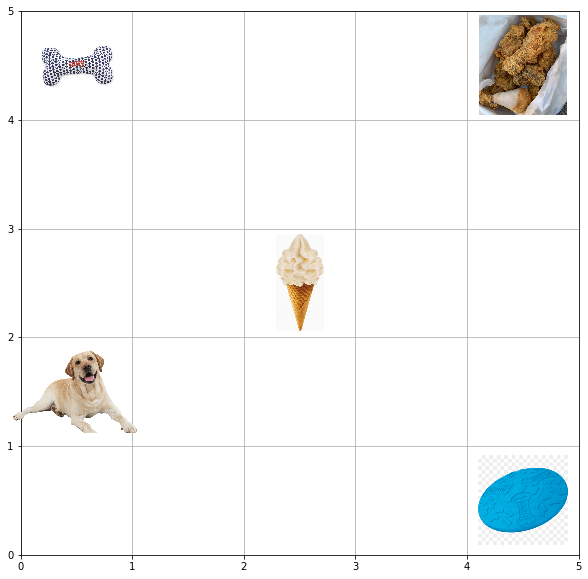

Info: Step: 7, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

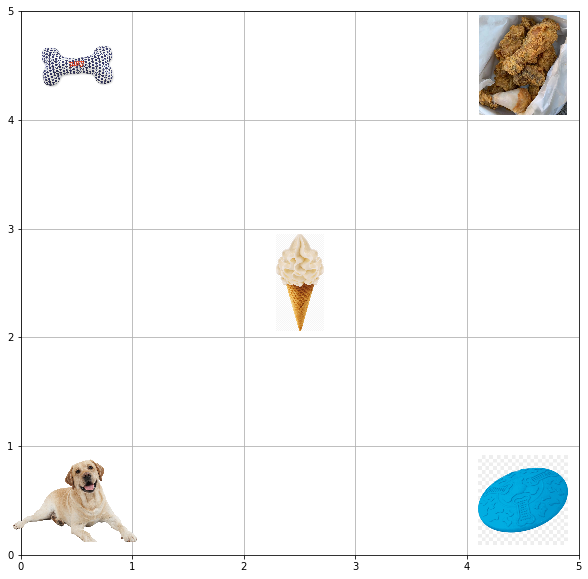

Info: Step: 8, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

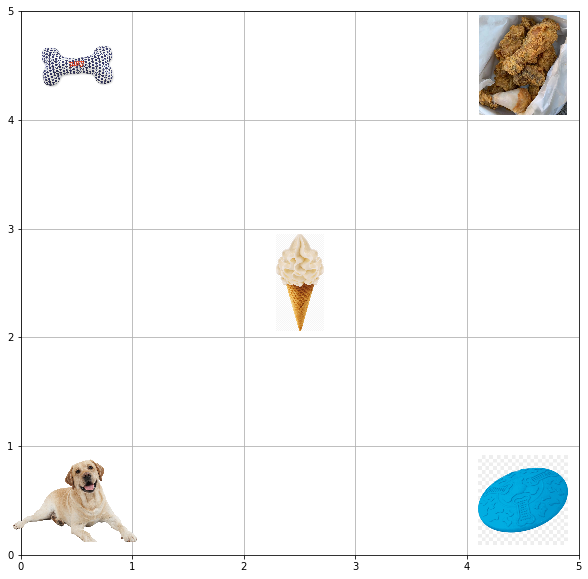

Info: Step: 9, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

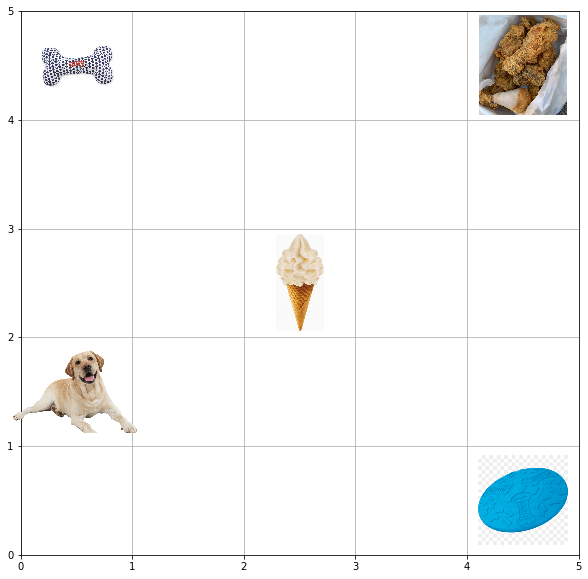

Info: Step: 10, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

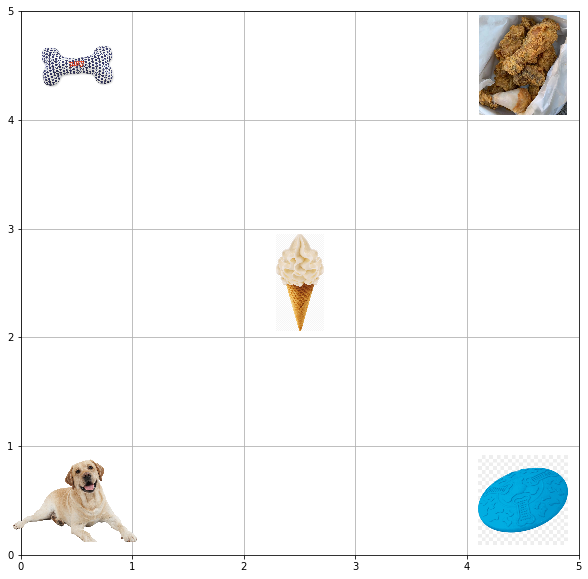

Info: Step: 11, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

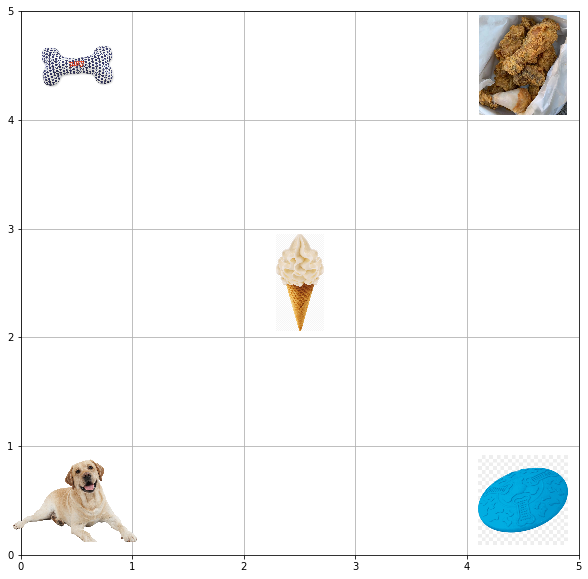

Info: Step: 12, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

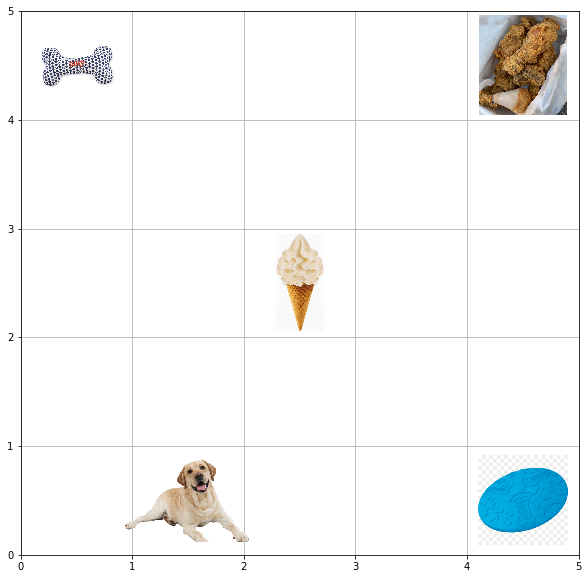

Info: Step: 13, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

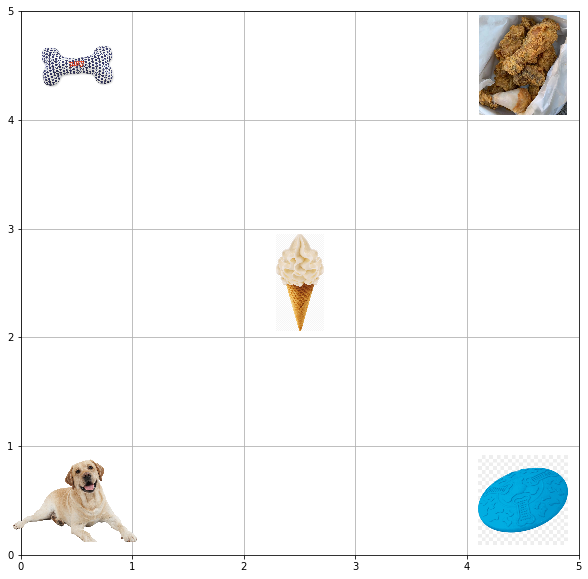

Info: Step: 14, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

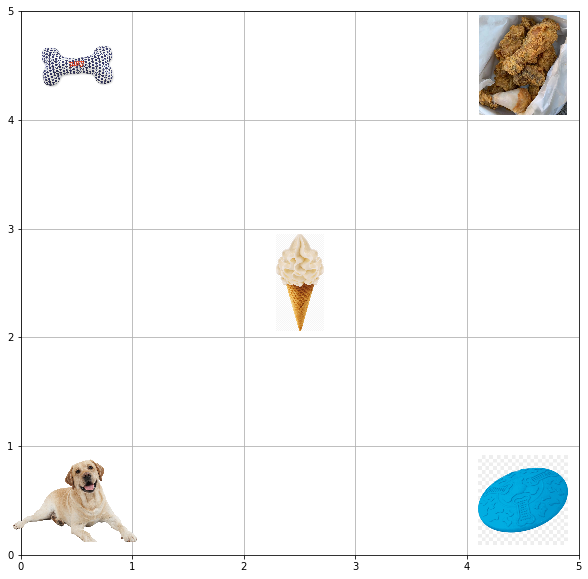

Info: Step: 15, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

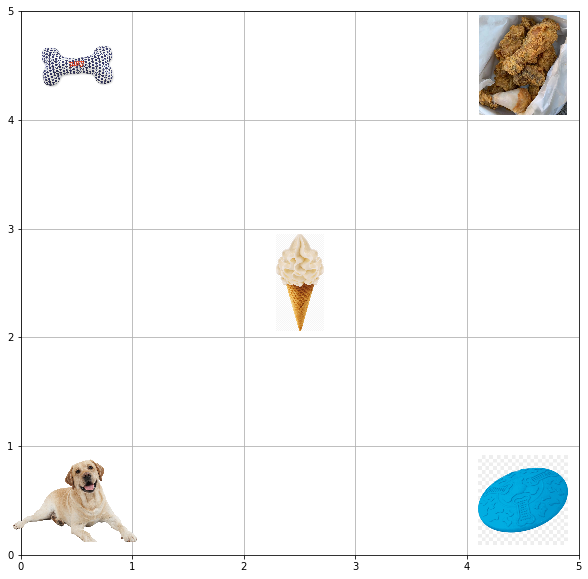

Info: Step: 16, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

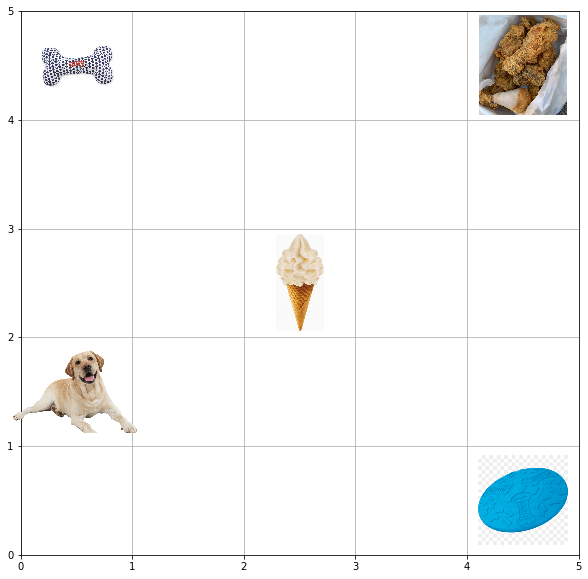

Info: Step: 17, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

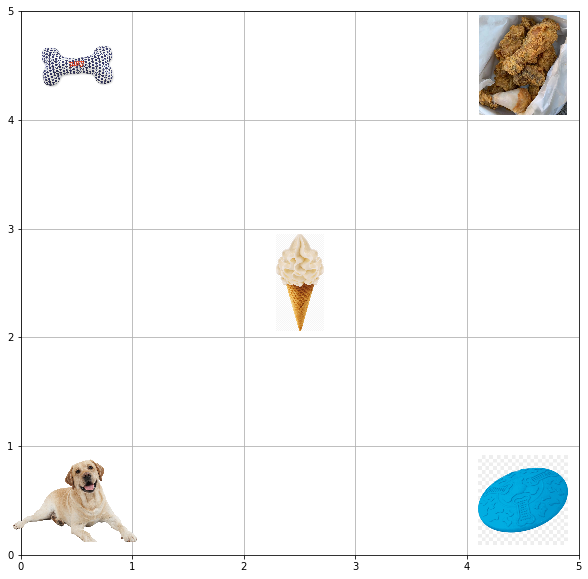

Info: Step: 18, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

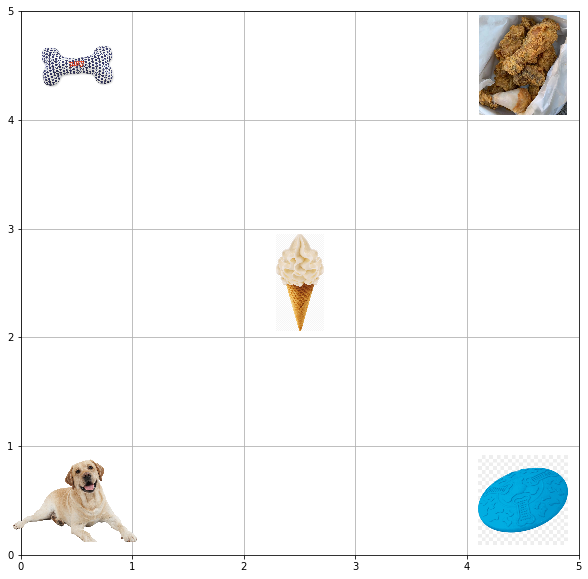

Info: Step: 19, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

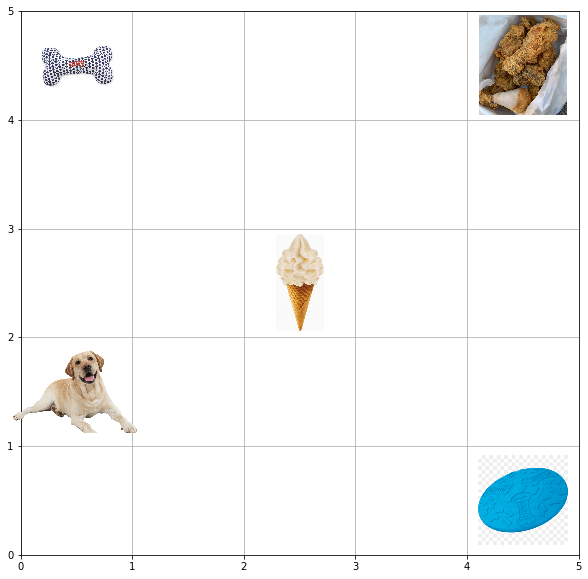

Info: Step: 20, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

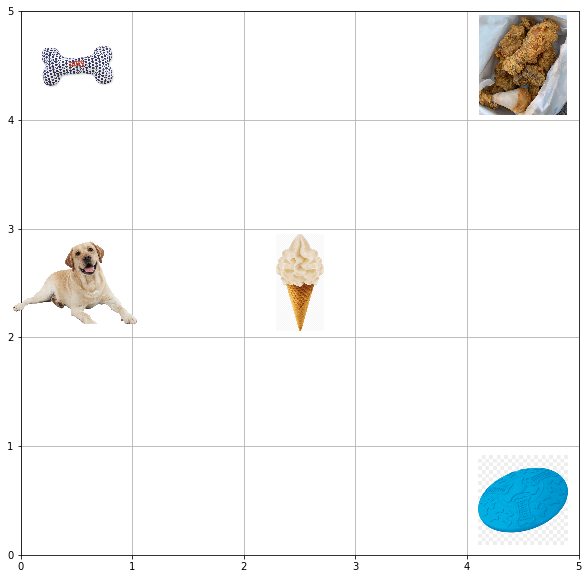

Info: Step: 21, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

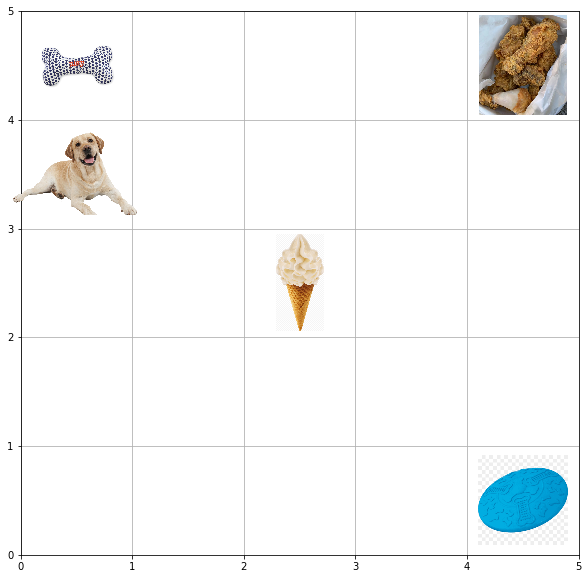

Info: Step: 22, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

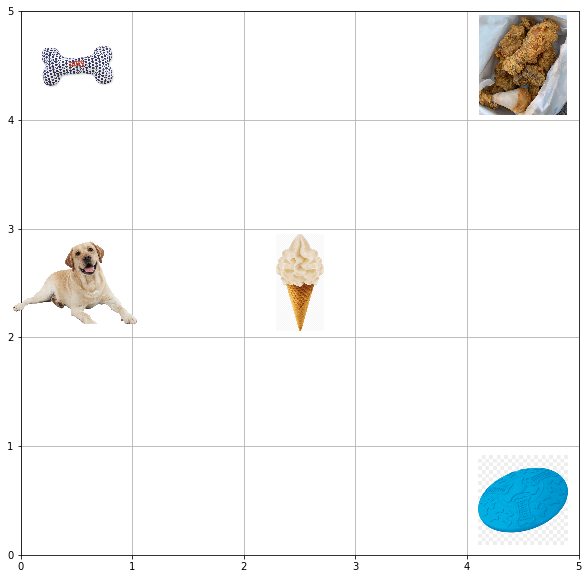

Info: Step: 23, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

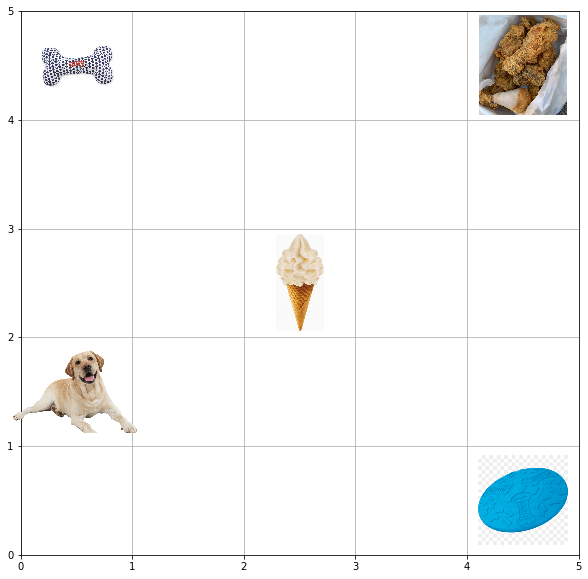

Info: Step: 24, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

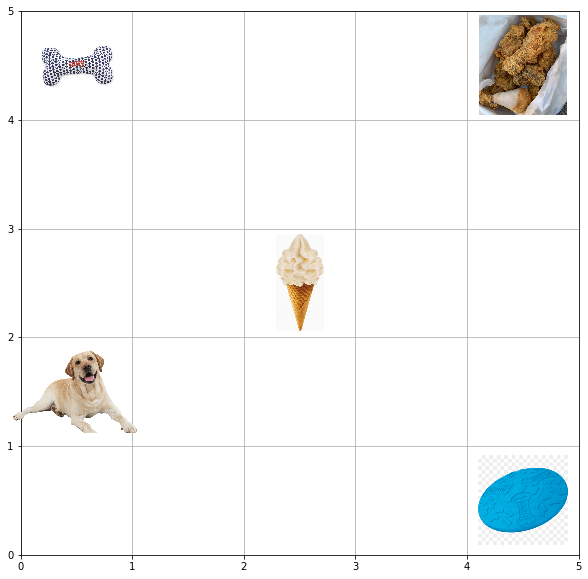

Info: Step: 25, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

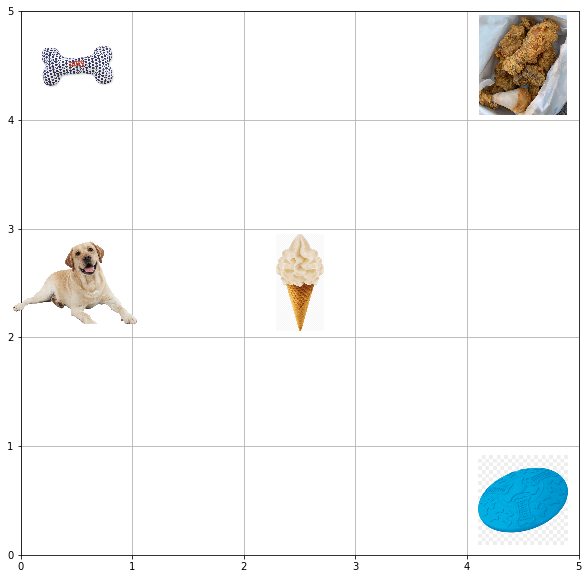

Info: Step: 26, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

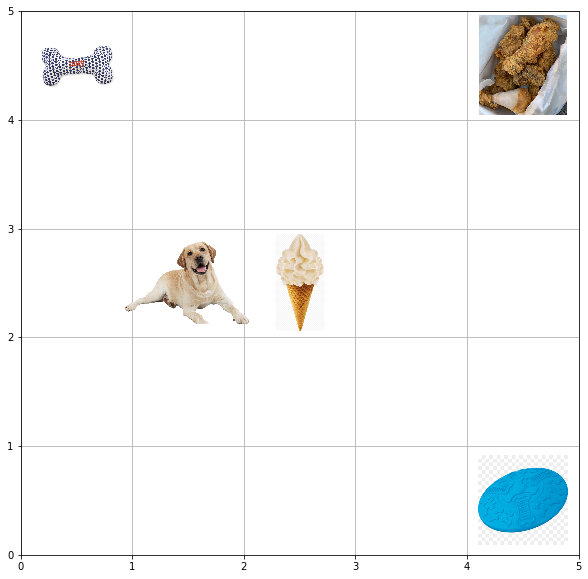

Info: Step: 27, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

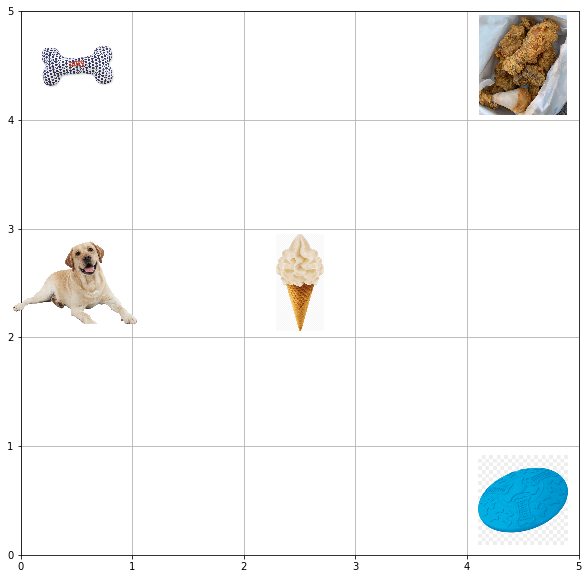

Info: Step: 28, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

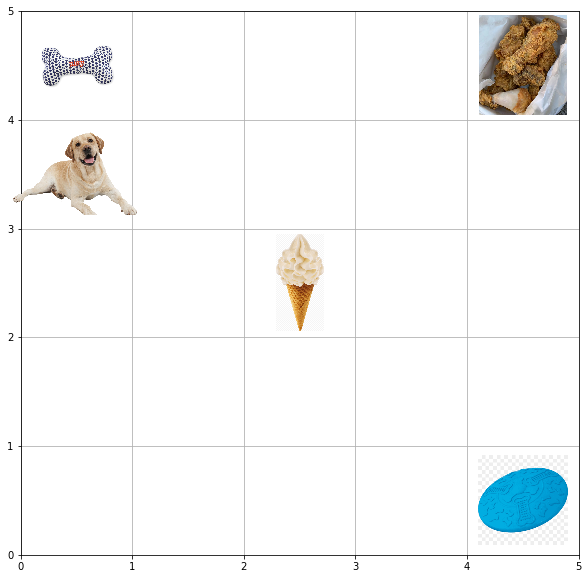

Info: Step: 29, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:0
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

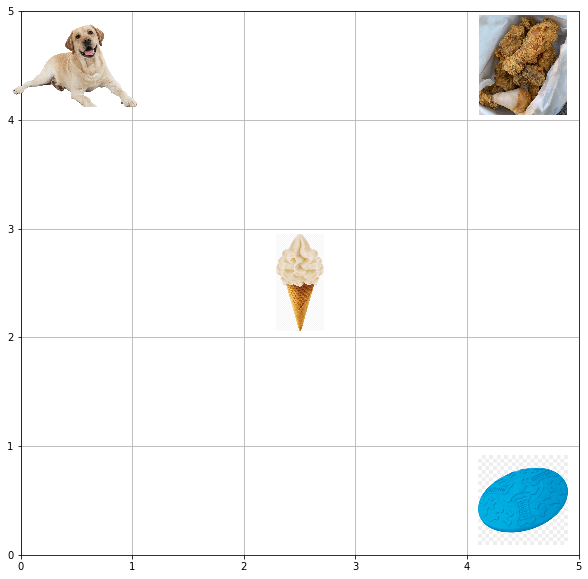

Info: Step: 30, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up'], 
 Current reward:-10, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

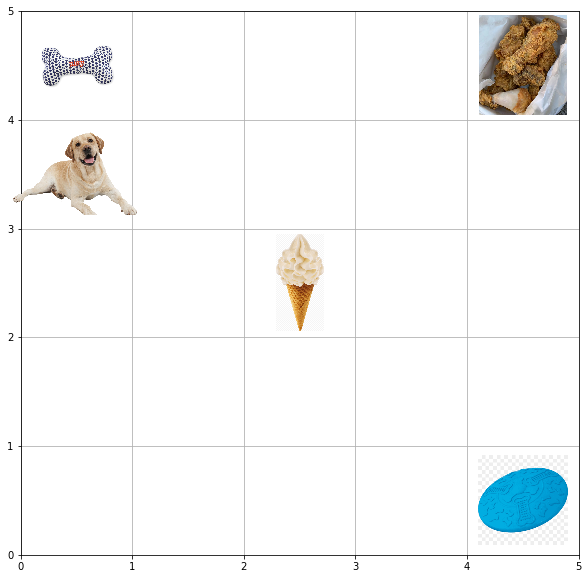

Info: Step: 31, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

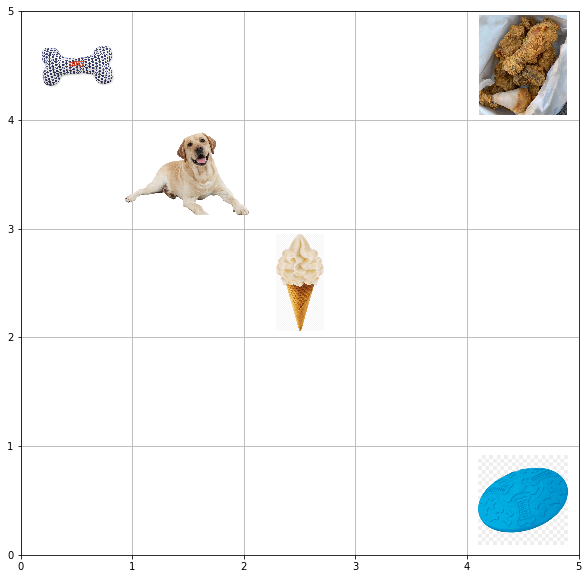

Info: Step: 32, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

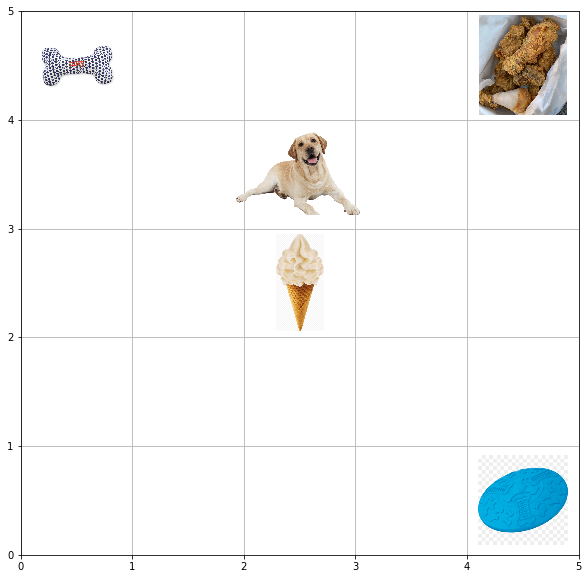

Info: Step: 33, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

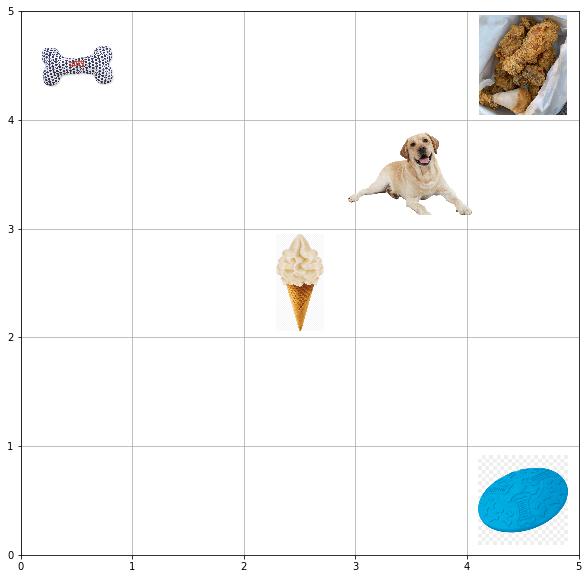

Info: Step: 34, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

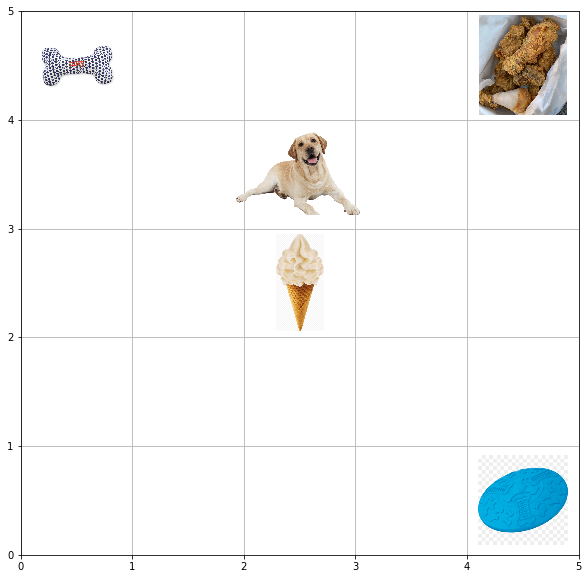

Info: Step: 35, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

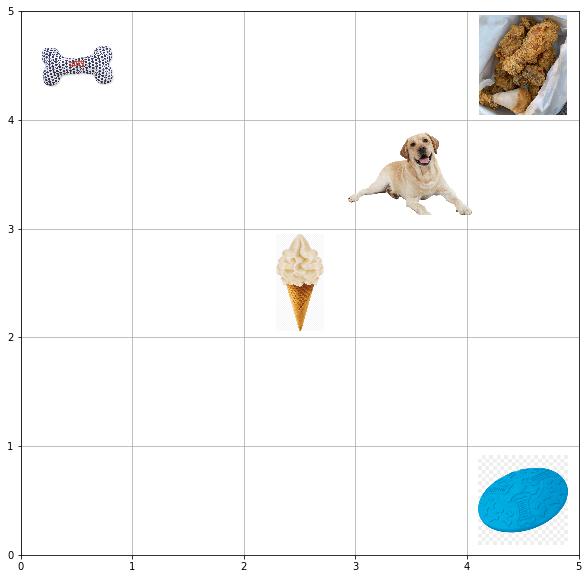

Info: Step: 36, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

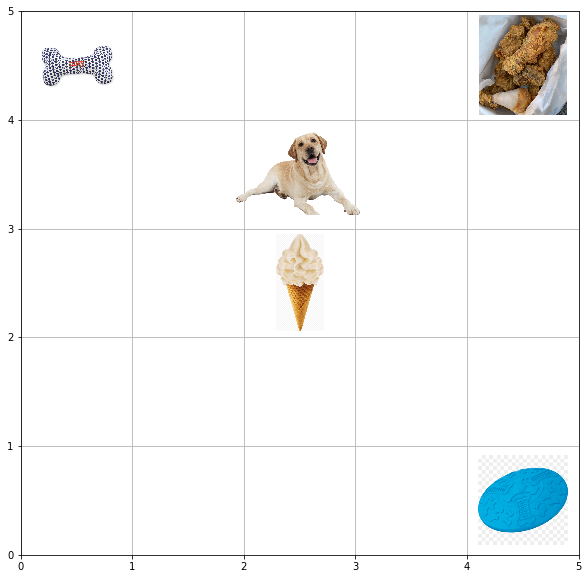

Info: Step: 37, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

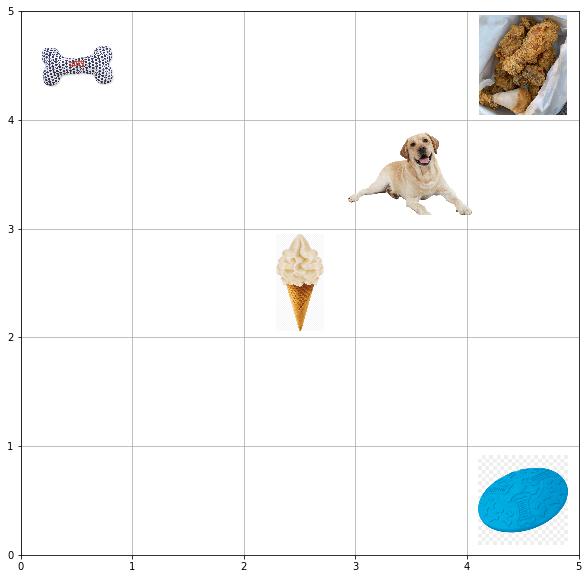

Info: Step: 38, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

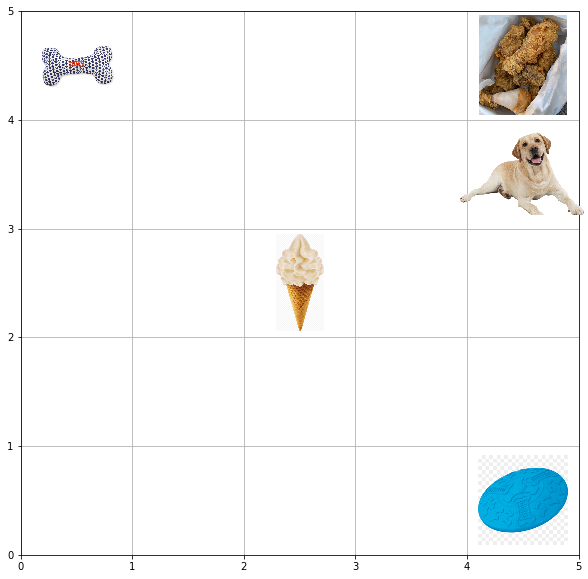

Info: Step: 39, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

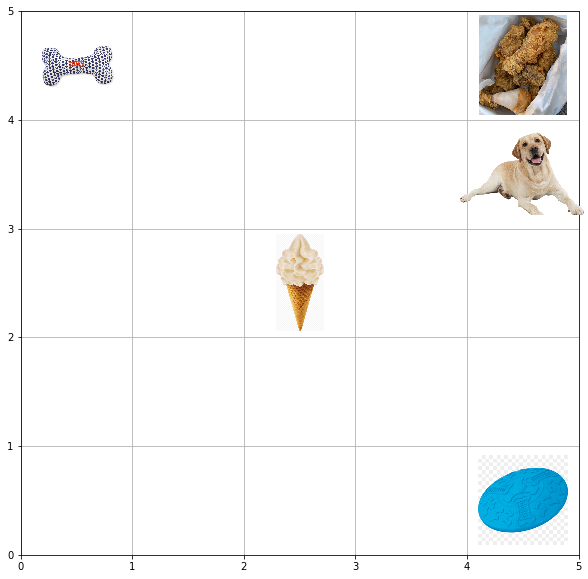

Info: Step: 40, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

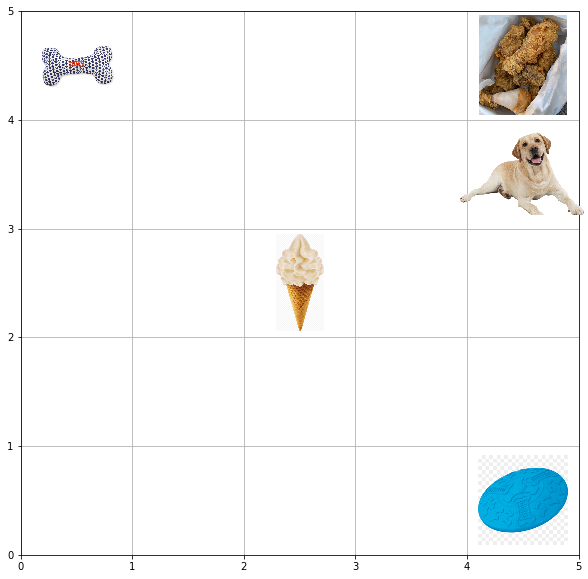

Info: Step: 41, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

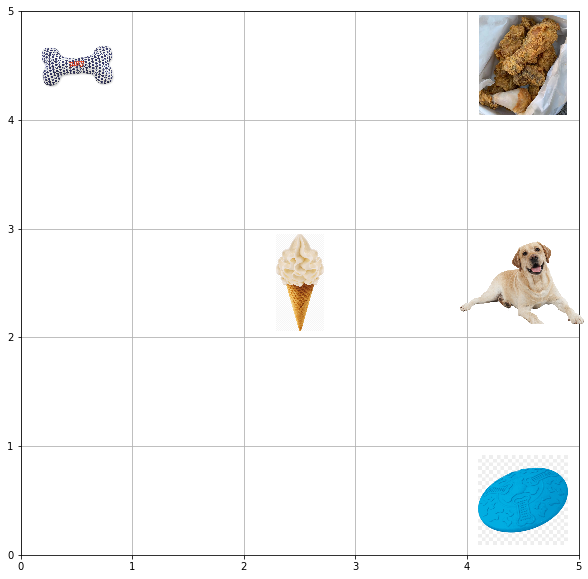

Info: Step: 42, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

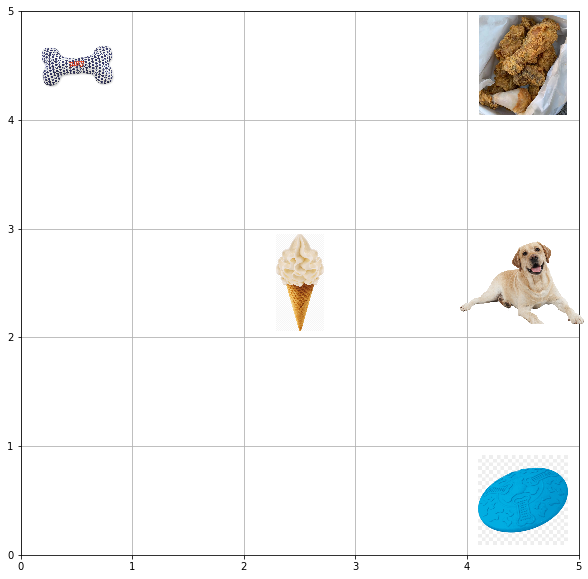

Info: Step: 43, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

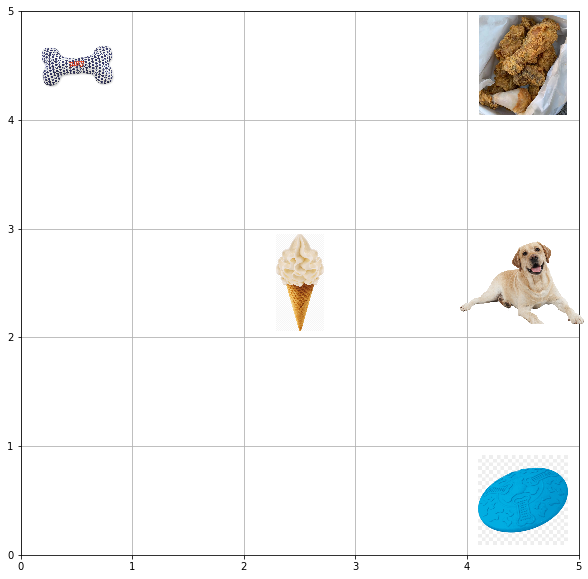

Info: Step: 44, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

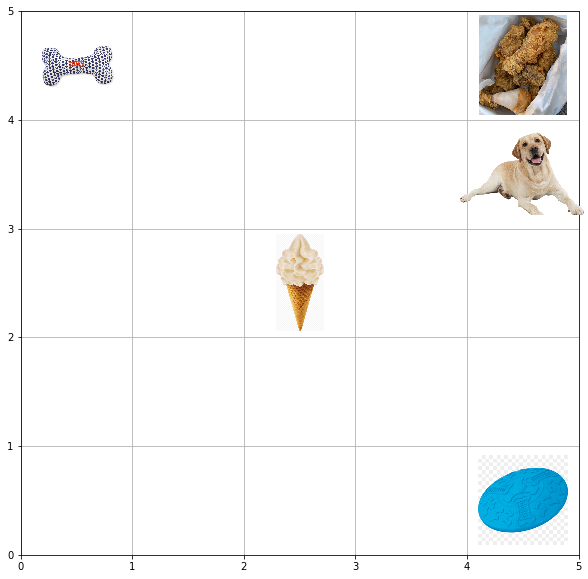

Info: Step: 45, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

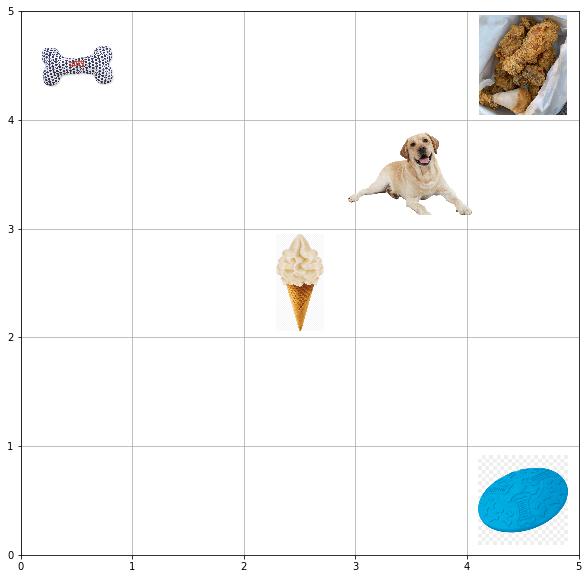

Info: Step: 46, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

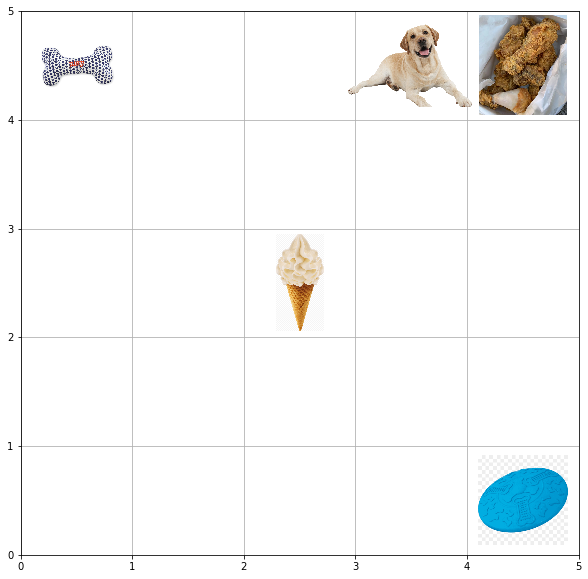

Info: Step: 47, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

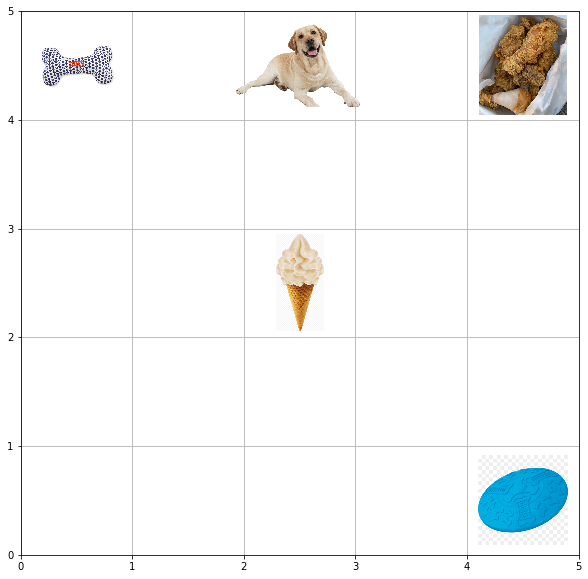

Info: Step: 48, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

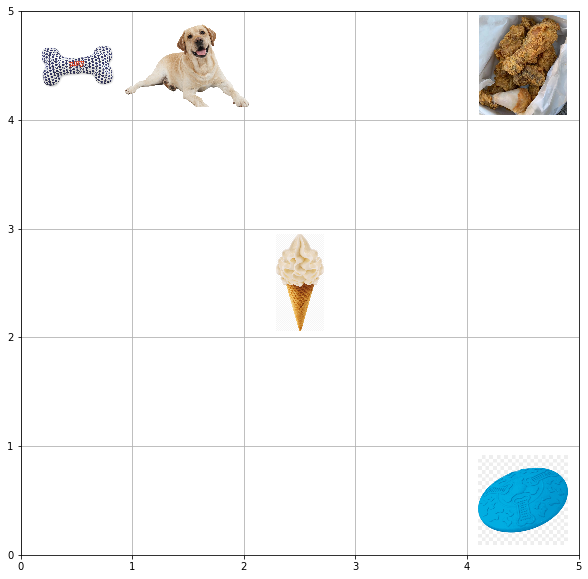

Info: Step: 49, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

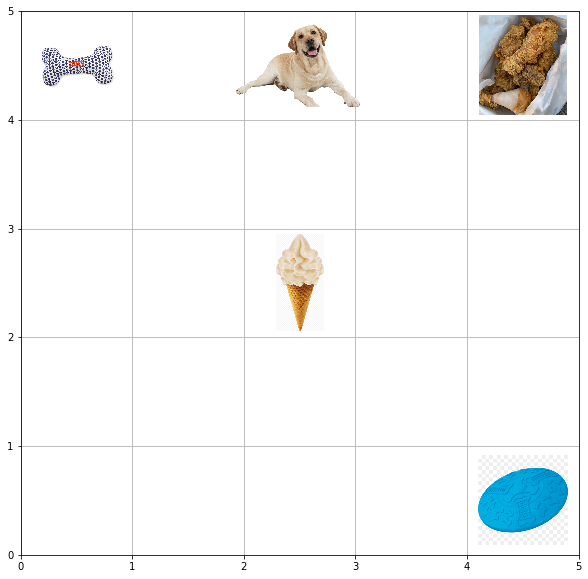

Info: Step: 50, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

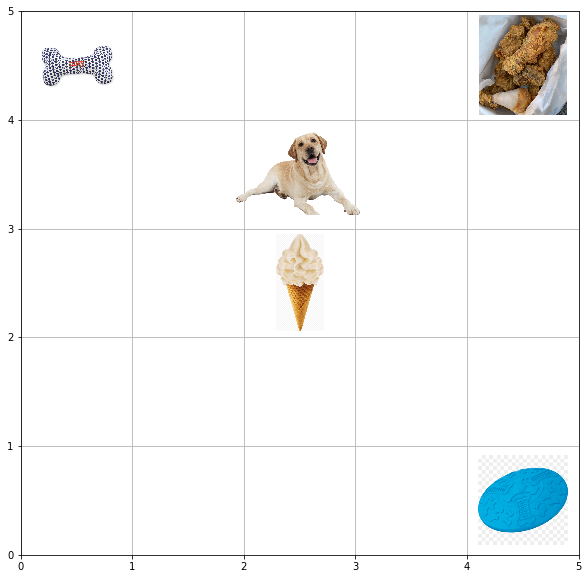

Info: Step: 51, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

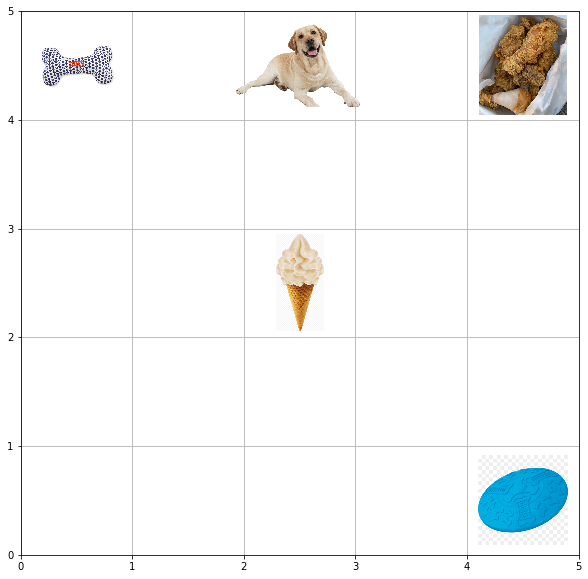

Info: Step: 52, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

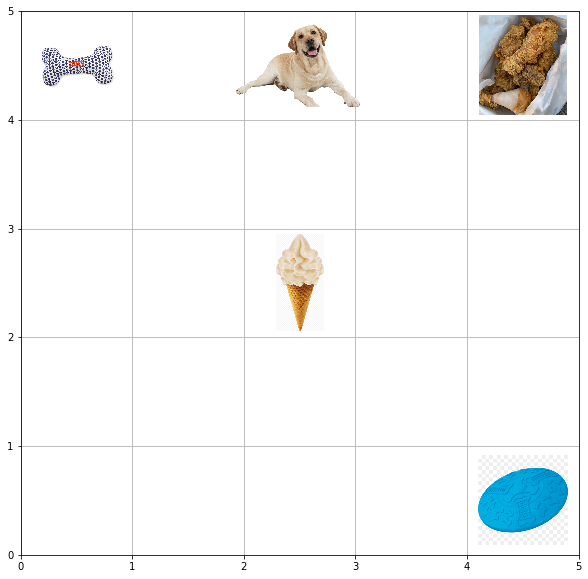

Info: Step: 53, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

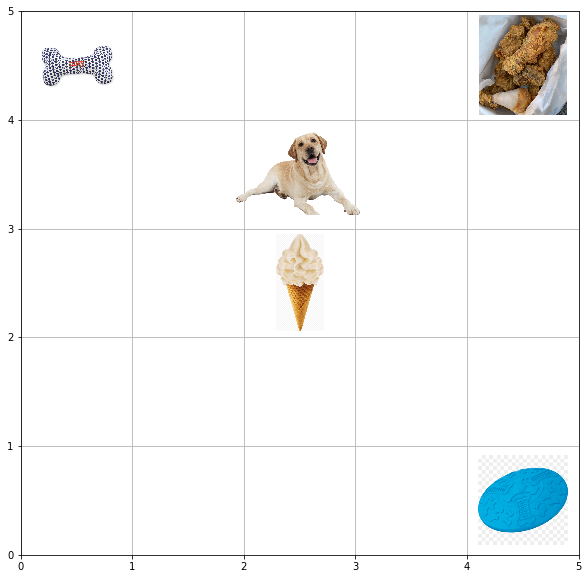

Info: Step: 54, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

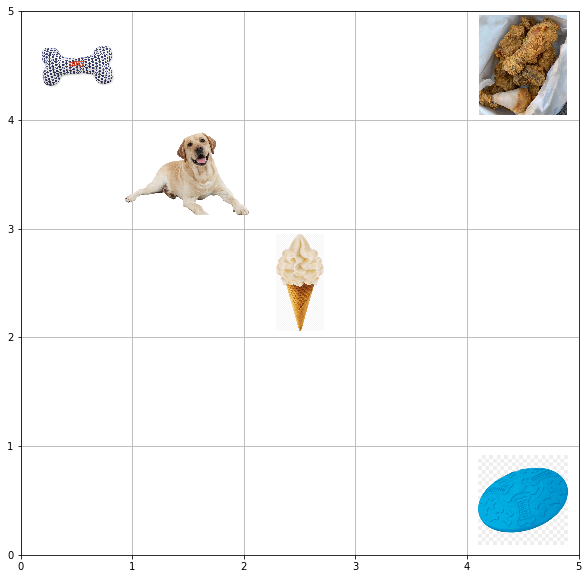

Info: Step: 55, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

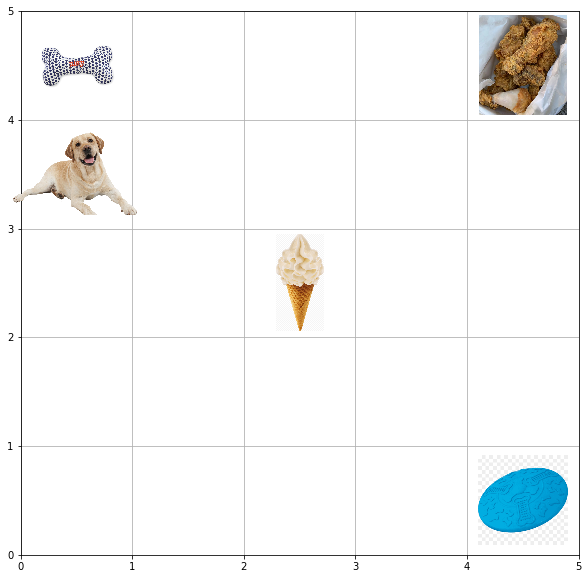

Info: Step: 56, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

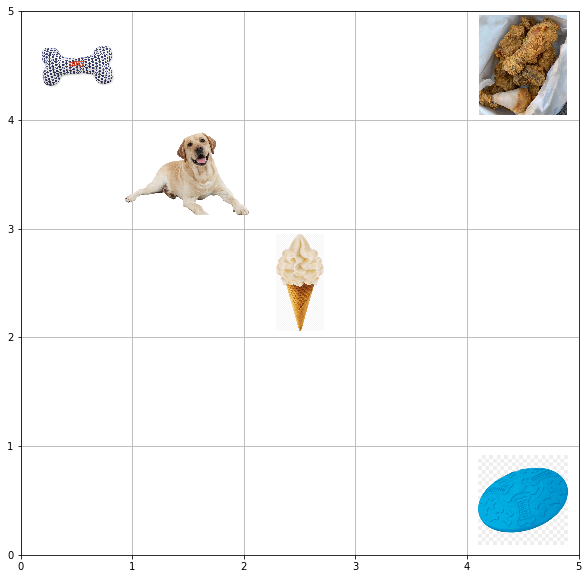

Info: Step: 57, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

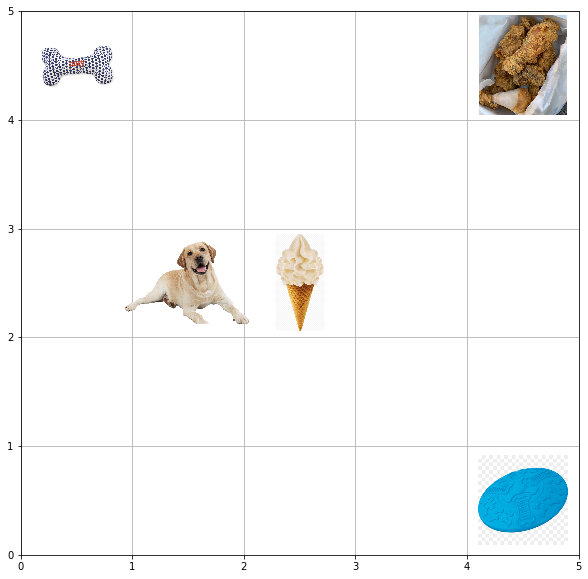

Info: Step: 58, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

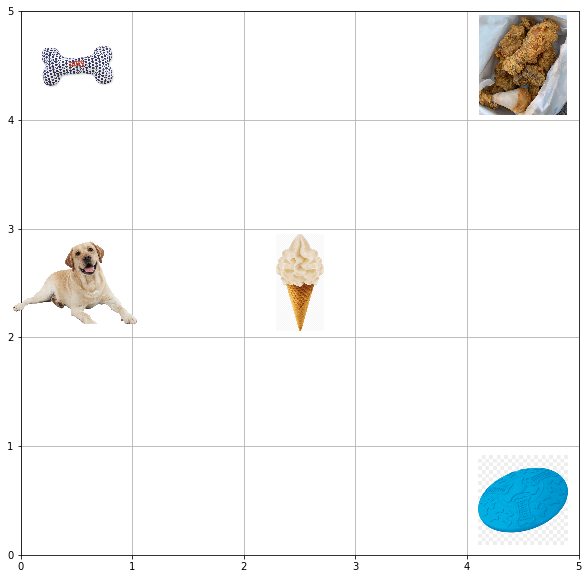

Info: Step: 59, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

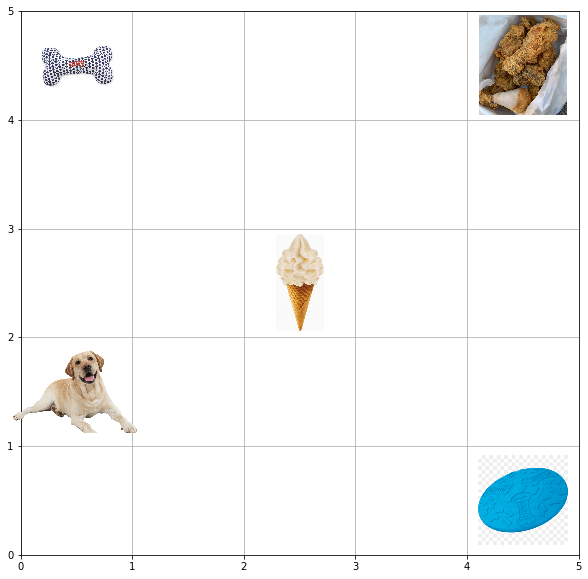

Info: Step: 60, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

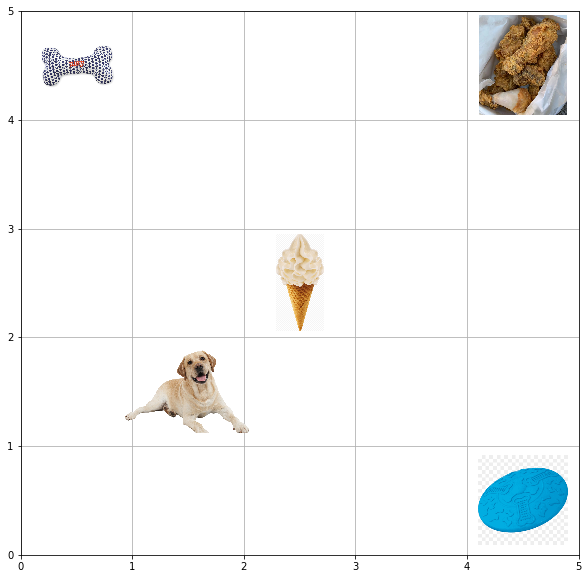

Info: Step: 61, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

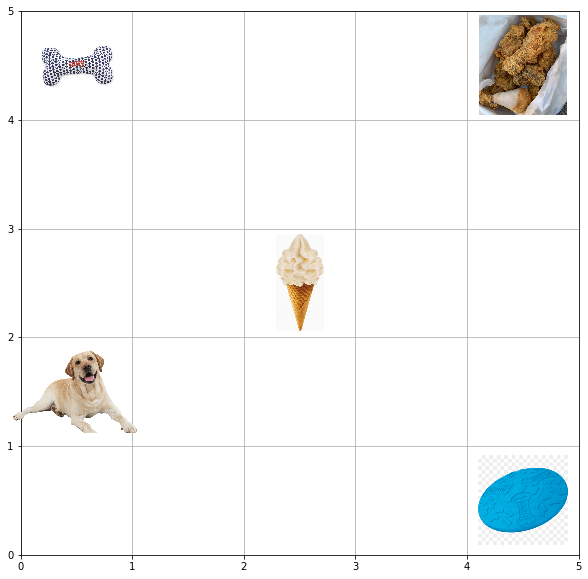

Info: Step: 62, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

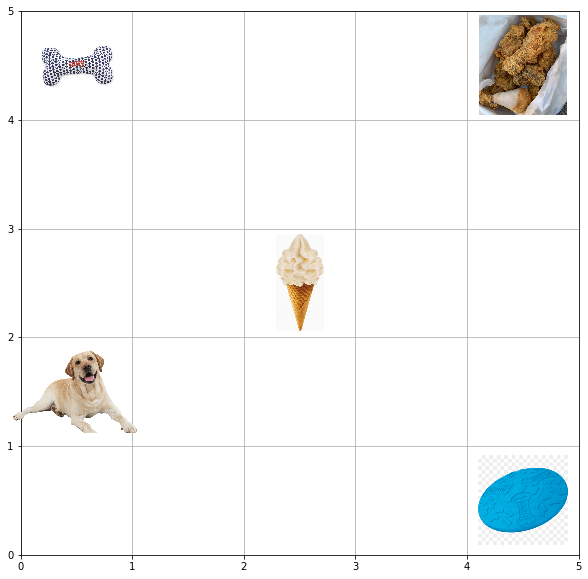

Info: Step: 63, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

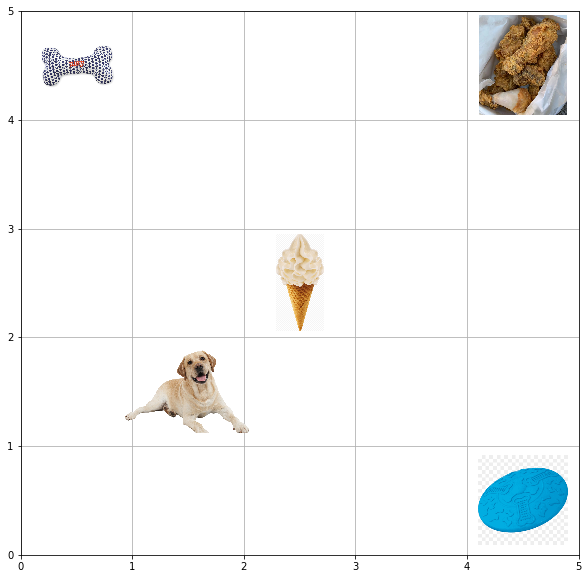

Info: Step: 64, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

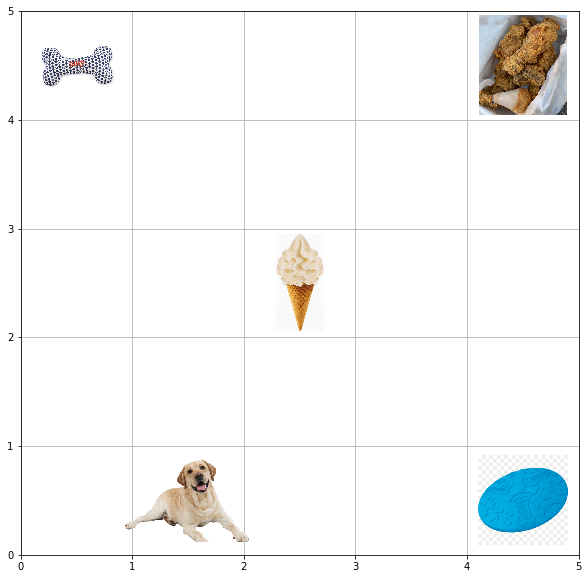

Info: Step: 65, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

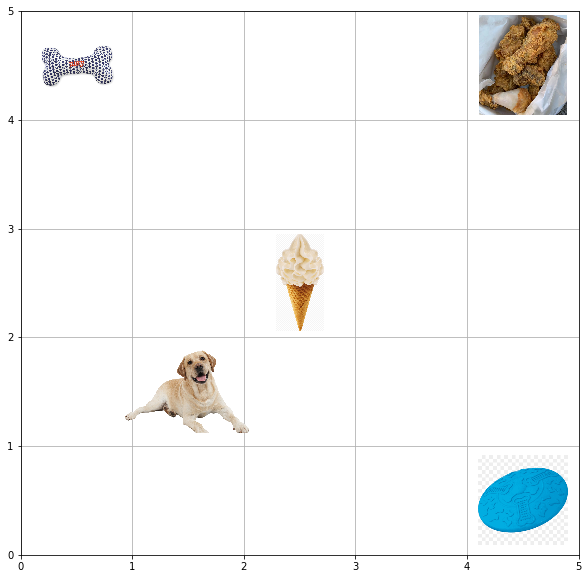

Info: Step: 66, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

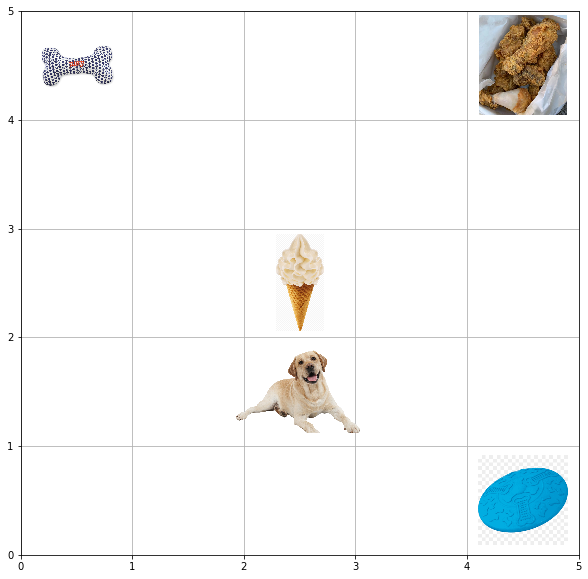

Info: Step: 67, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

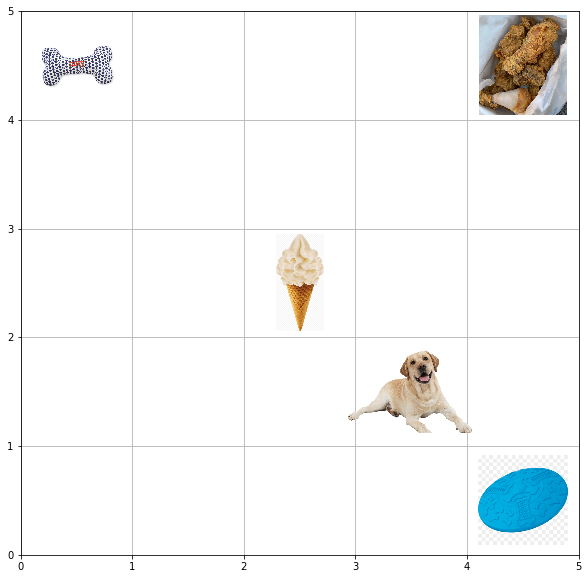

Info: Step: 68, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

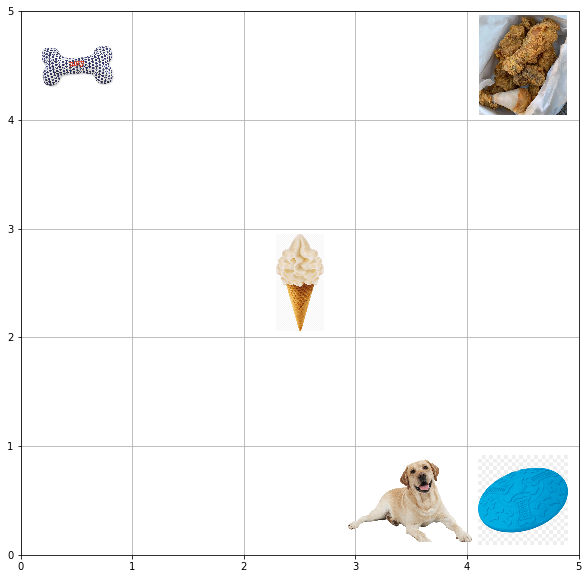

Info: Step: 69, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

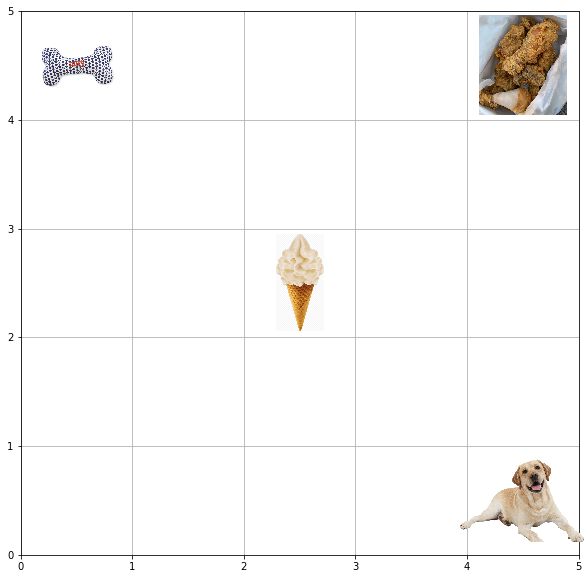

Info: Step: 70, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right'], 
 Current reward:-20, 
 Total reward:-30
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

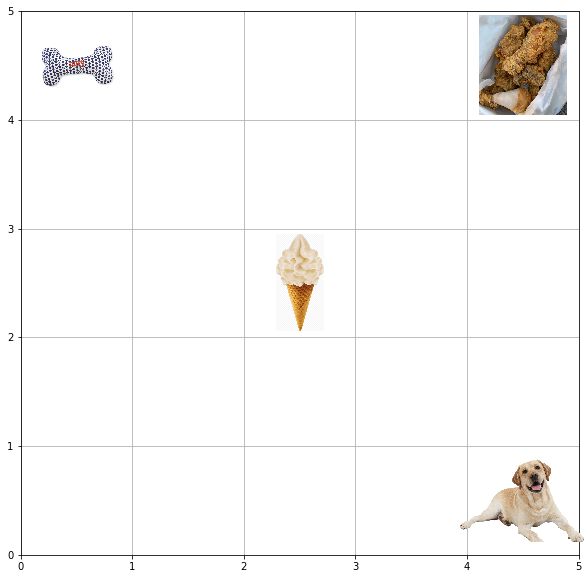

Info: Step: 71, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right'], 
 Current reward:-20, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

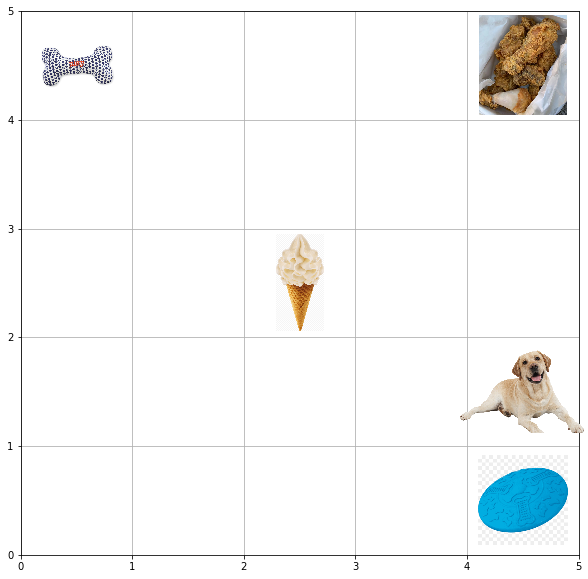

Info: Step: 72, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

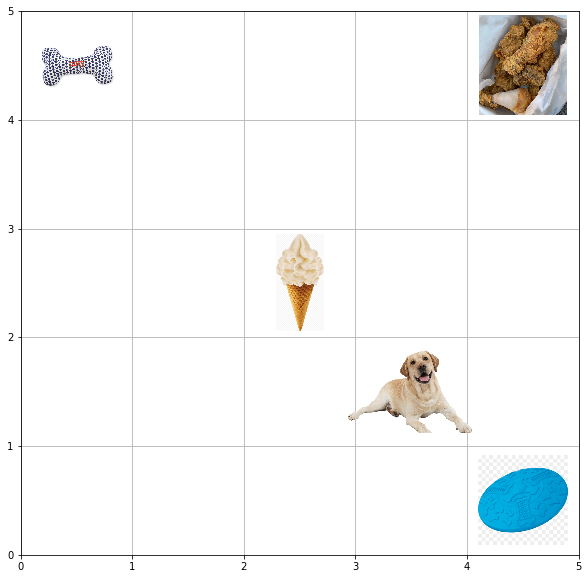

Info: Step: 73, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

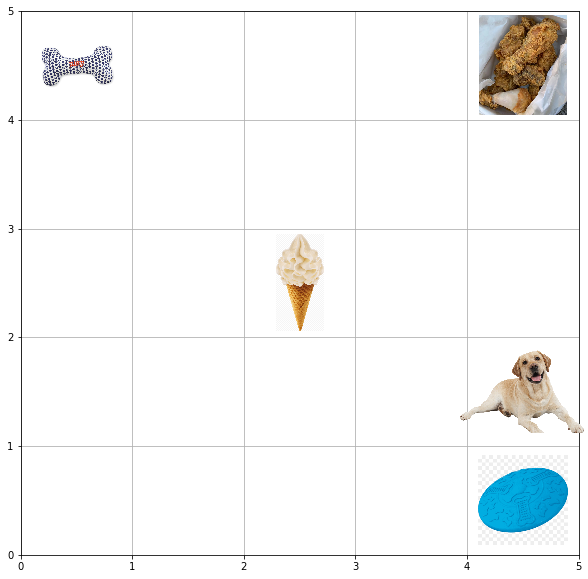

Info: Step: 74, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

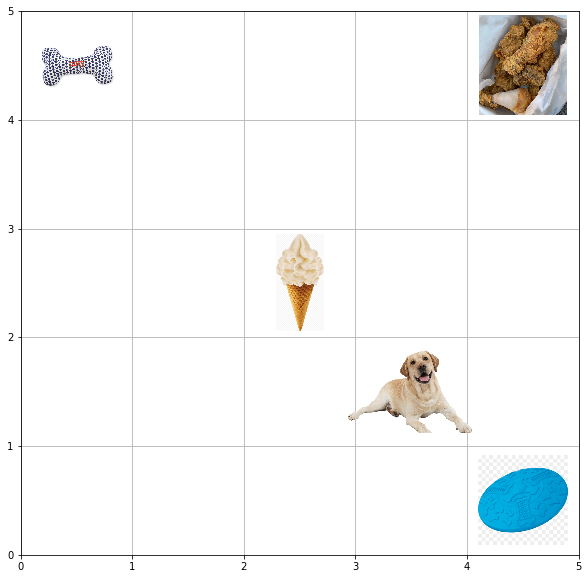

Info: Step: 75, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

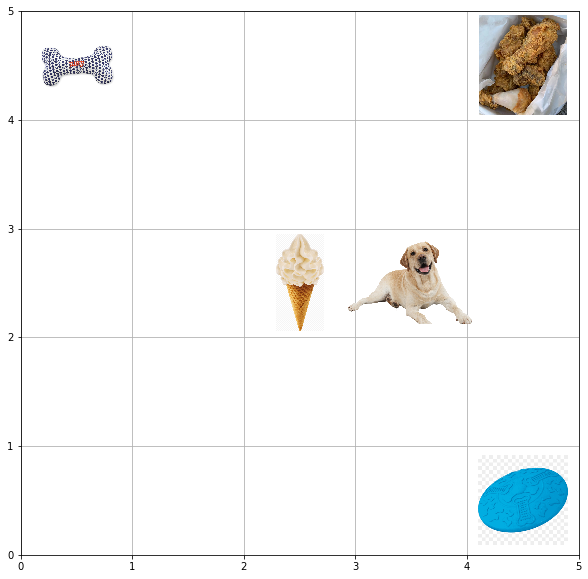

Info: Step: 76, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

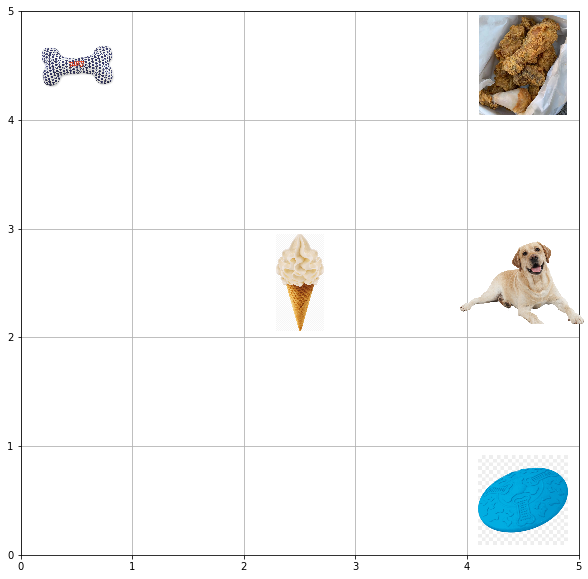

Info: Step: 77, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

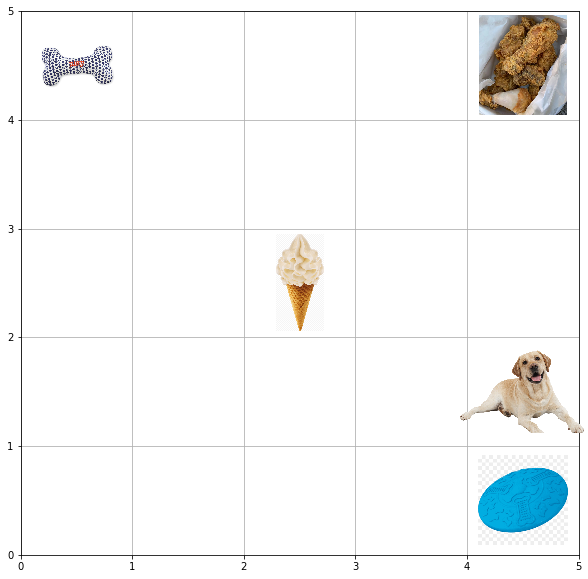

Info: Step: 78, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

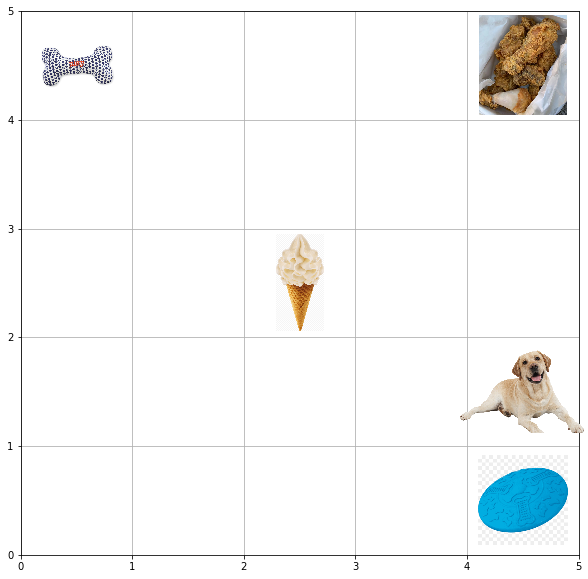

Info: Step: 79, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right'], 
 Current reward:0, 
 Total reward:-50
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

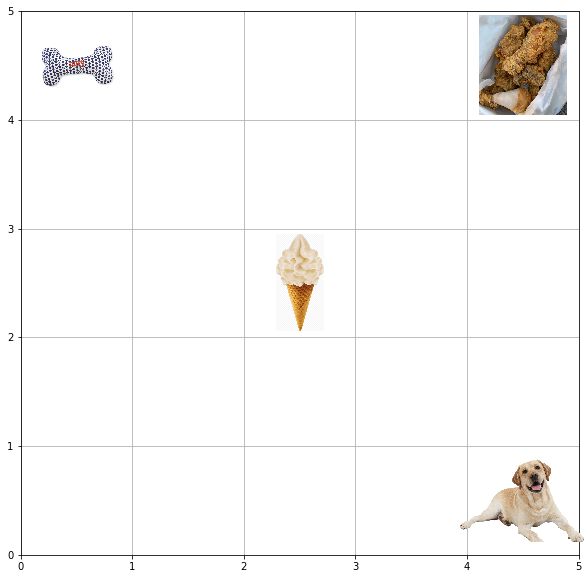

Info: Step: 80, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down'], 
 Current reward:-20, 
 Total reward:-70
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

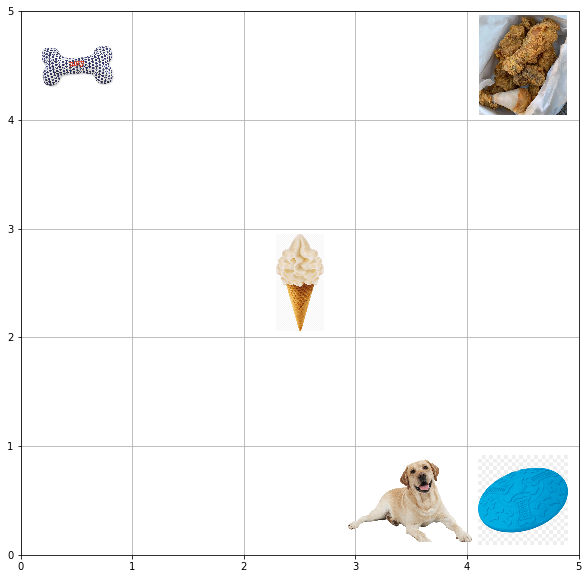

Info: Step: 81, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:-70
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

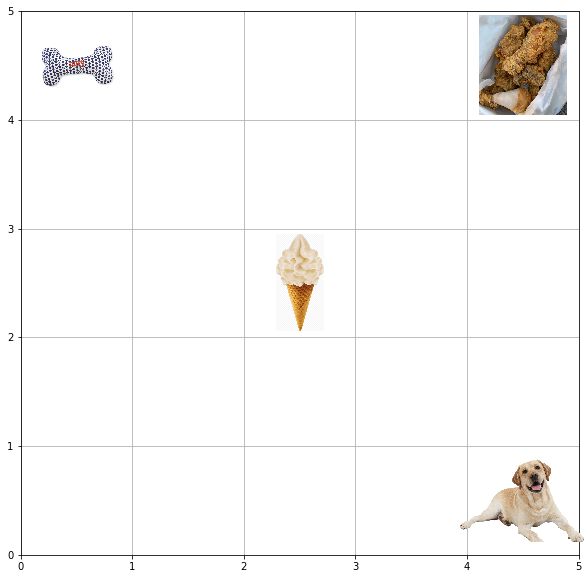

Info: Step: 82, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right'], 
 Current reward:-20, 
 Total reward:-90
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

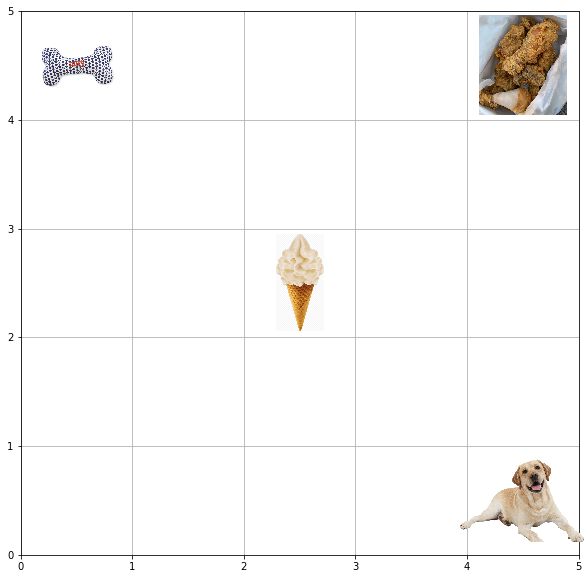

Info: Step: 83, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down'], 
 Current reward:-20, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

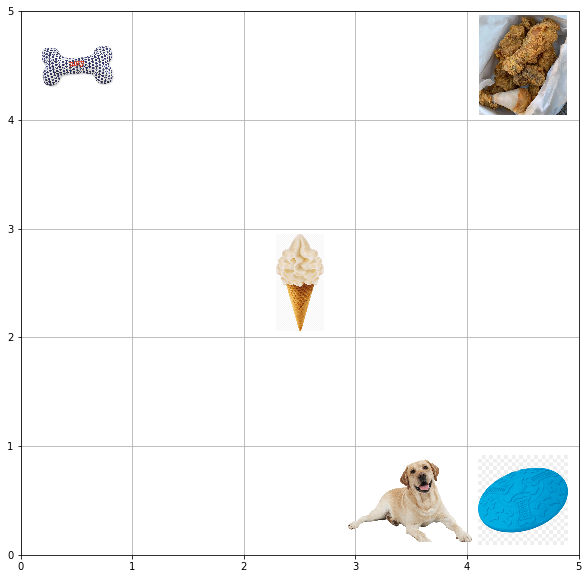

Info: Step: 84, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

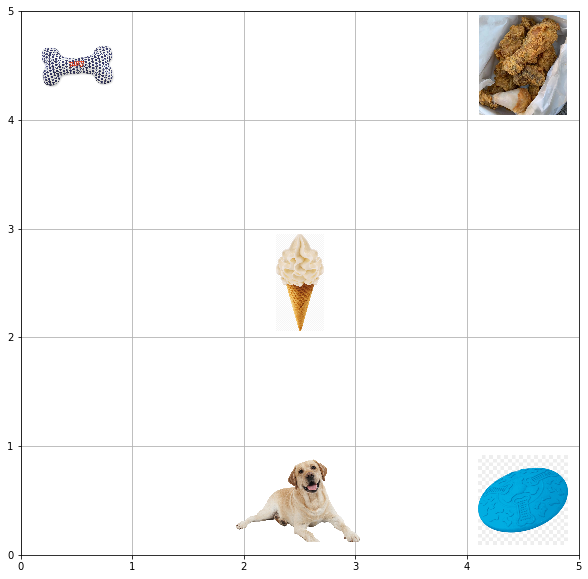

Info: Step: 85, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left'], 
 Current reward:0, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

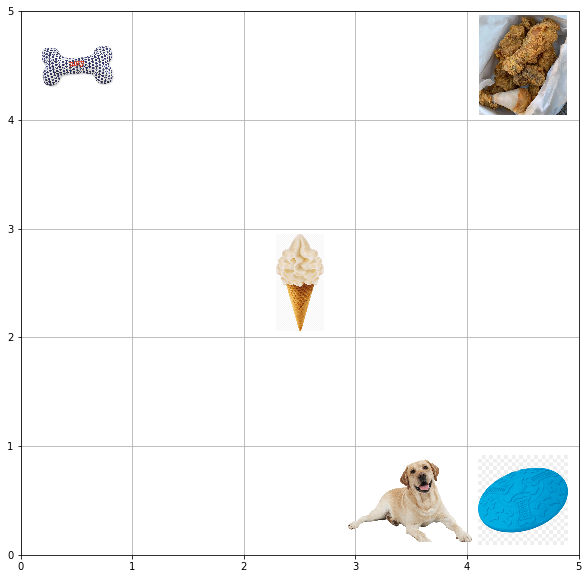

Info: Step: 86, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

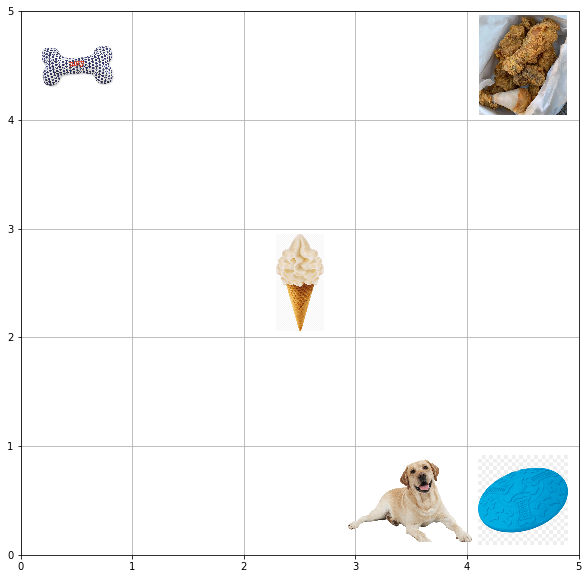

Info: Step: 87, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

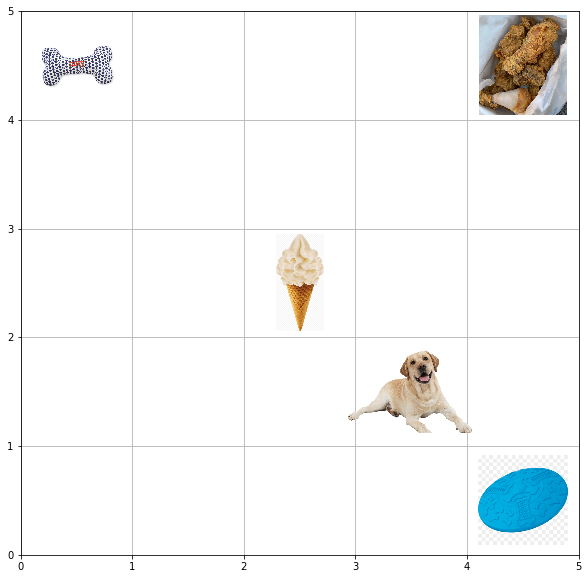

Info: Step: 88, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up'], 
 Current reward:0, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

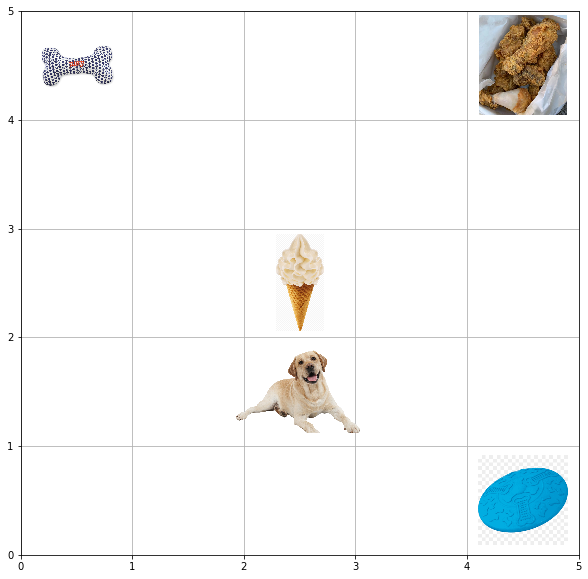

Info: Step: 89, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left'], 
 Current reward:0, 
 Total reward:-110
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

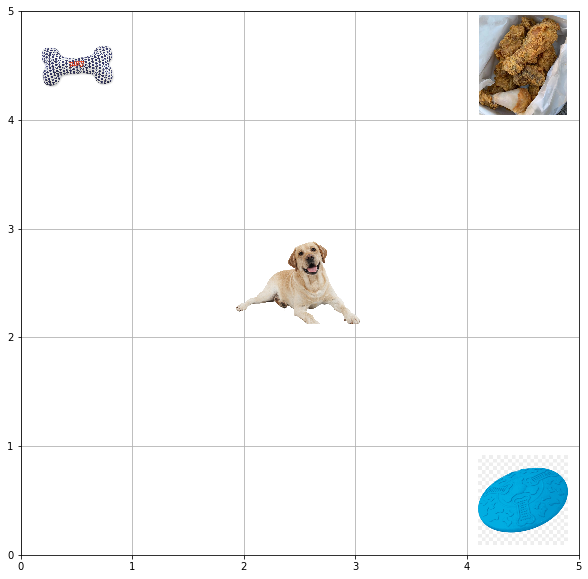

Info: Step: 90, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up'], 
 Current reward:50, 
 Total reward:-60
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

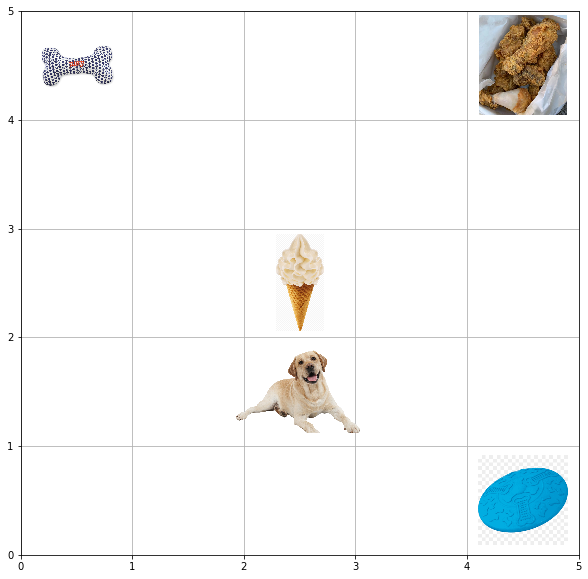

Info: Step: 91, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:-60
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

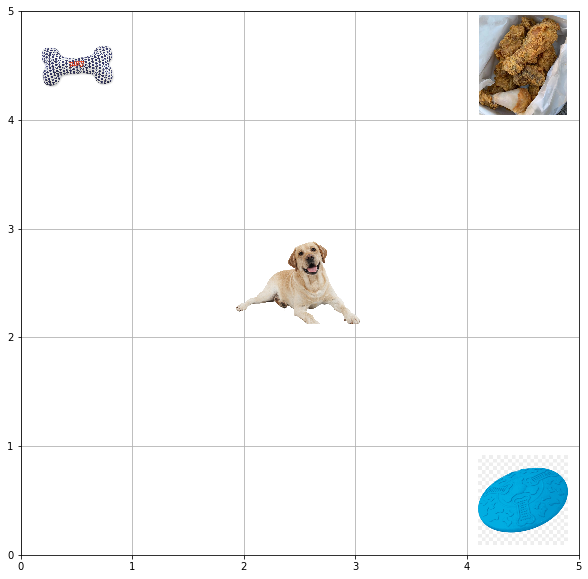

Info: Step: 92, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up'], 
 Current reward:50, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

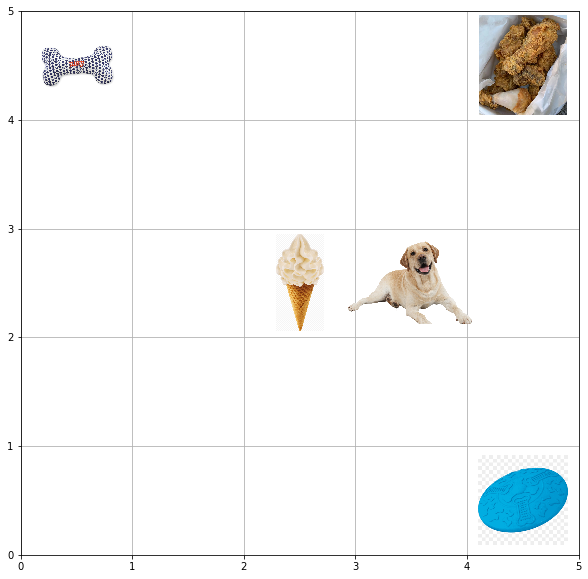

Info: Step: 93, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

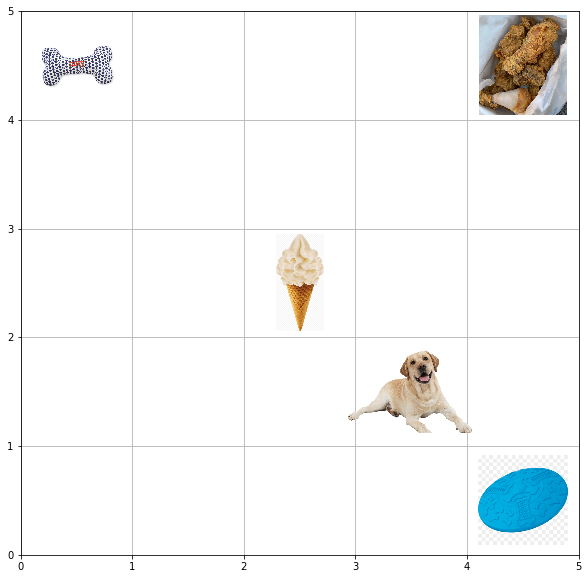

Info: Step: 94, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

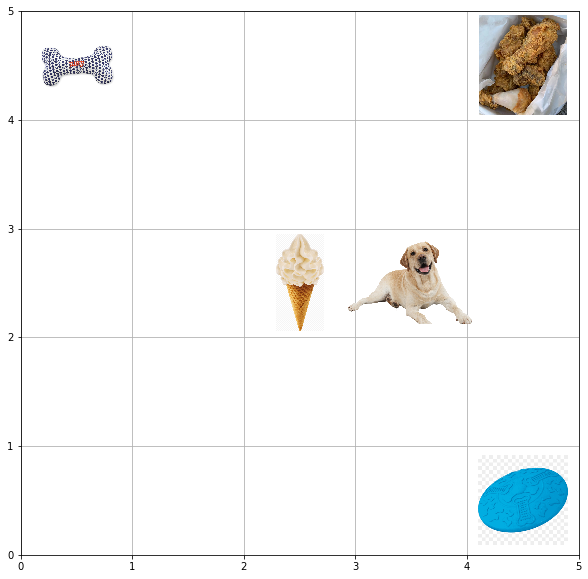

Info: Step: 95, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

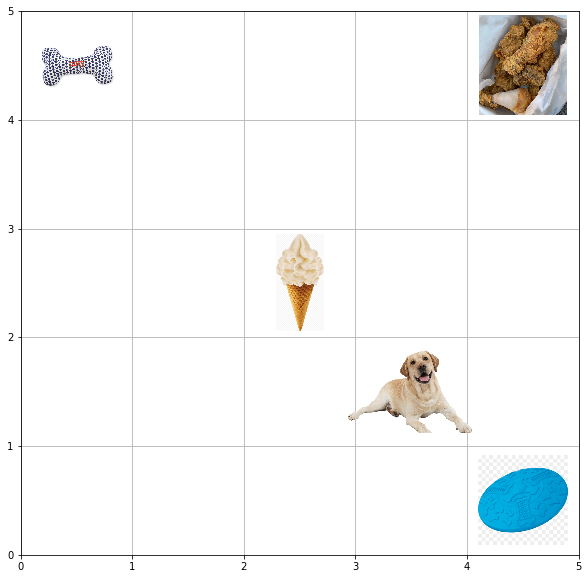

Info: Step: 96, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

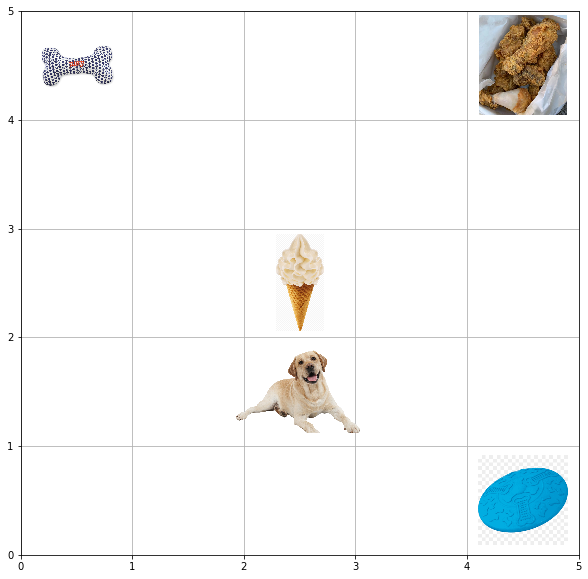

Info: Step: 97, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

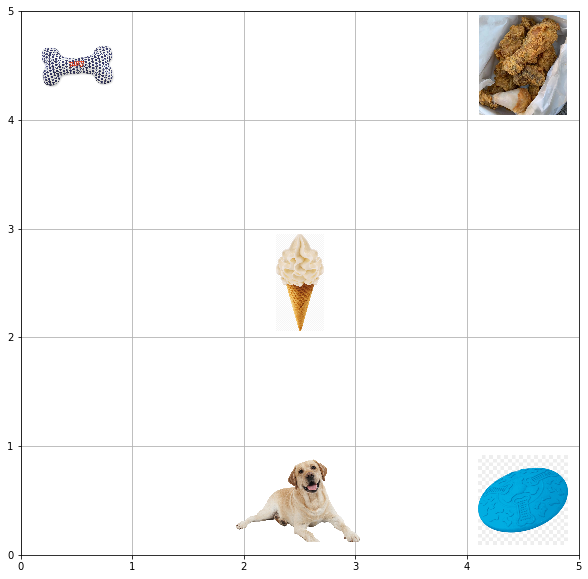

Info: Step: 98, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

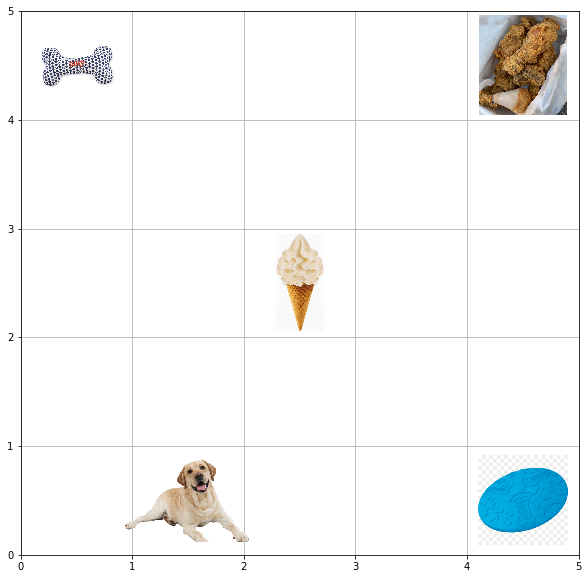

Info: Step: 99, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

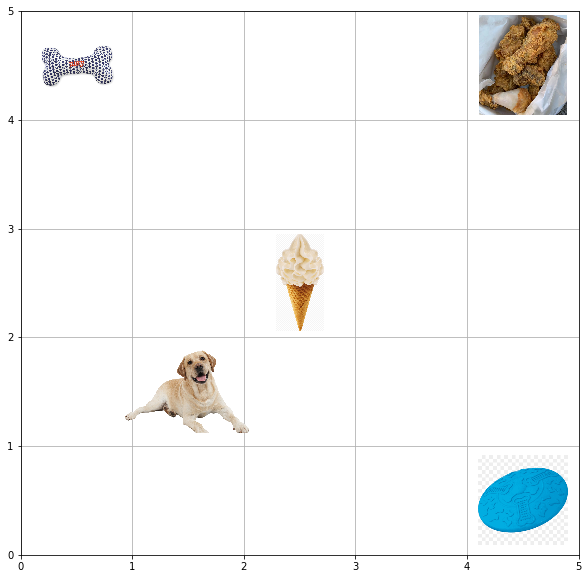

Info: Step: 100, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

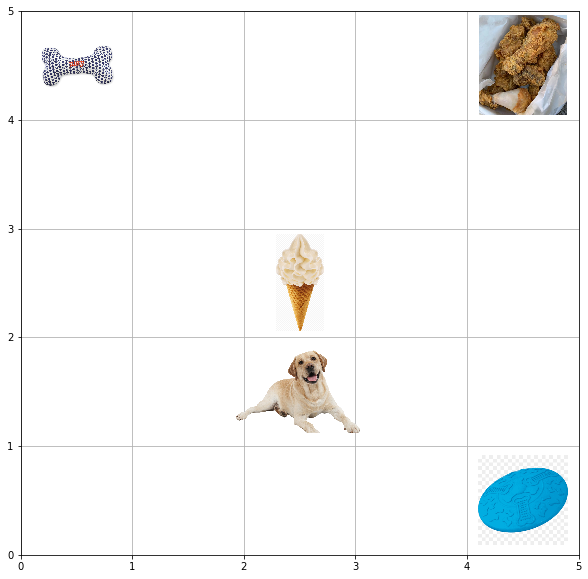

Info: Step: 101, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

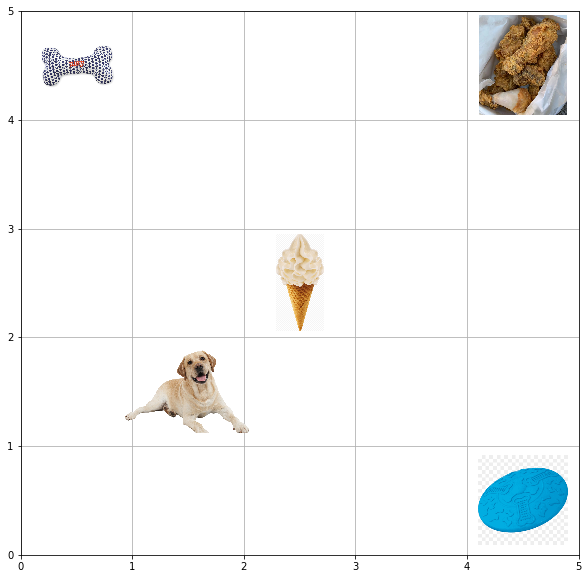

Info: Step: 102, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

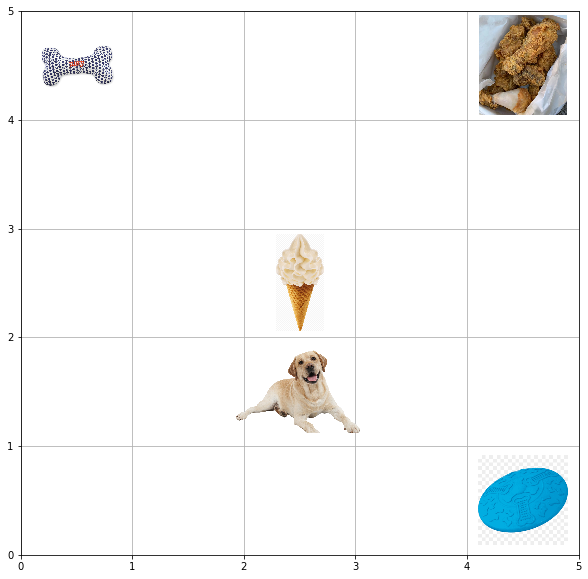

Info: Step: 103, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:-10
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

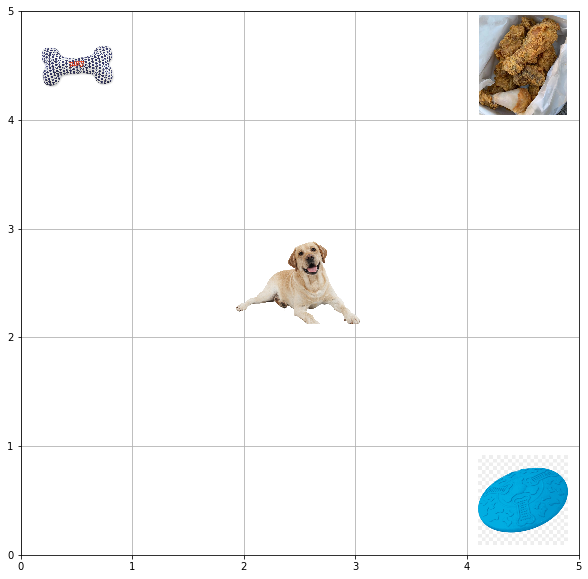

Info: Step: 104, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up'], 
 Current reward:50, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

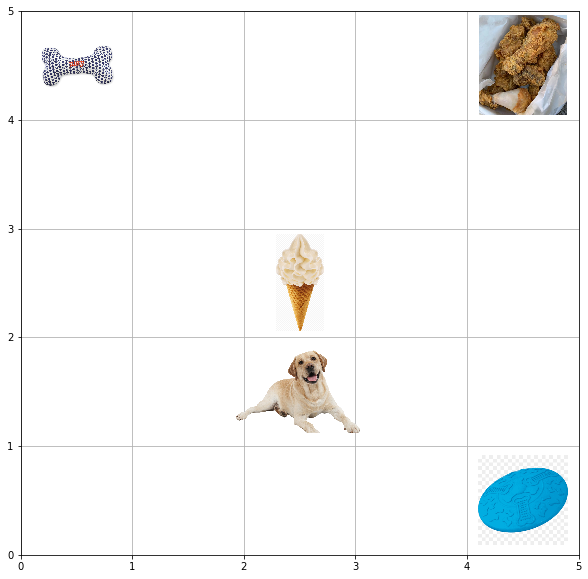

Info: Step: 105, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down'], 
 Current reward:0, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

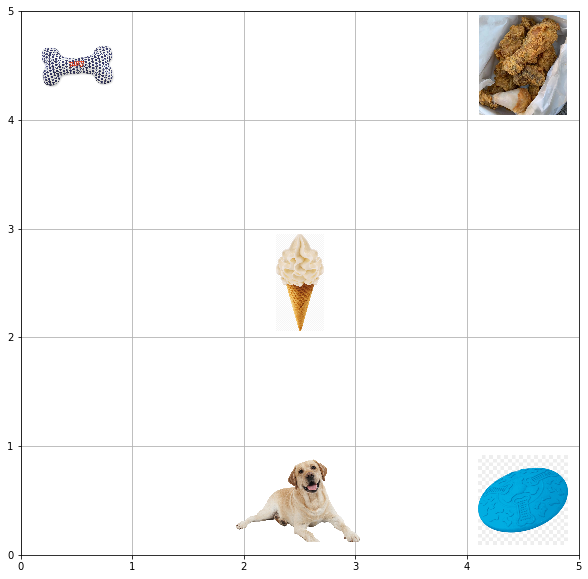

Info: Step: 106, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down'], 
 Current reward:0, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

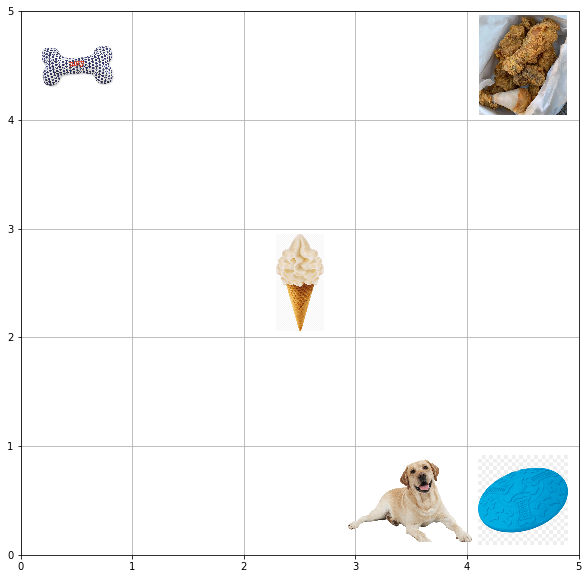

Info: Step: 107, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right'], 
 Current reward:0, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

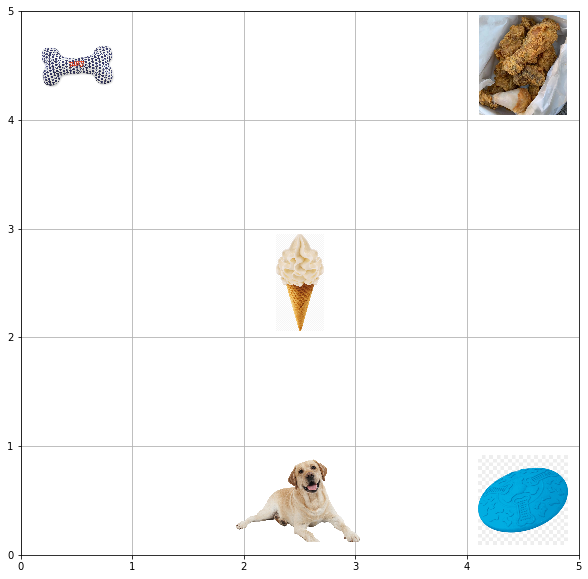

Info: Step: 108, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left'], 
 Current reward:0, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

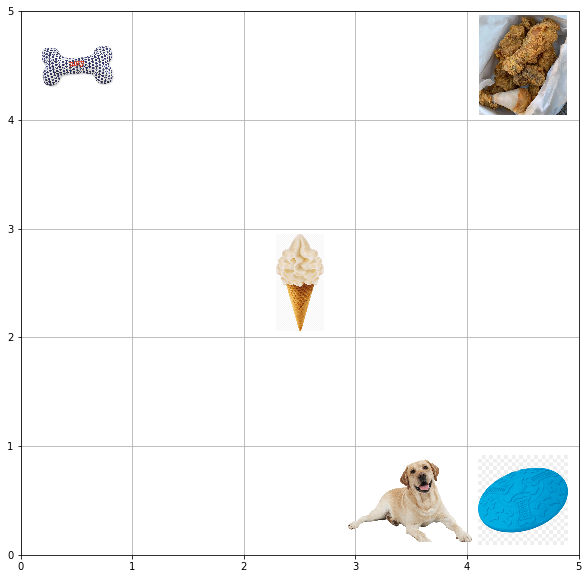

Info: Step: 109, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right'], 
 Current reward:0, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

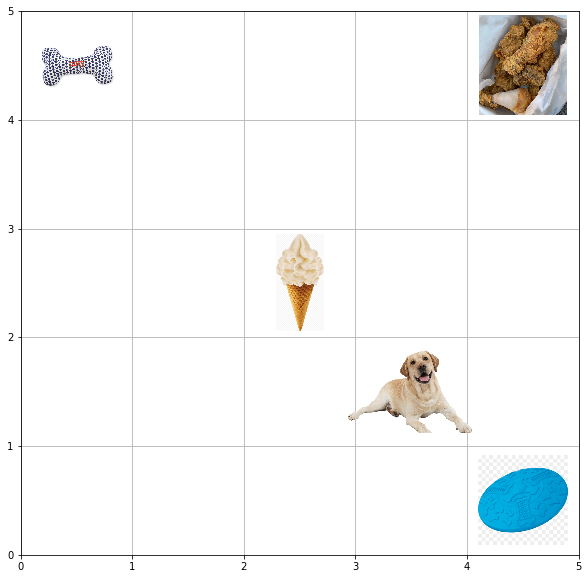

Info: Step: 110, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up'], 
 Current reward:0, 
 Total reward:40
Done: False


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

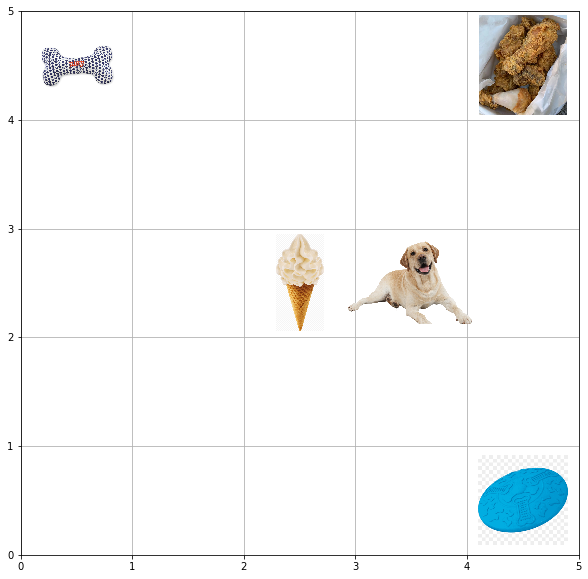

Info: Step: 111, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up'], 
 Current reward:0, 
 Total reward:40
Done: False

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

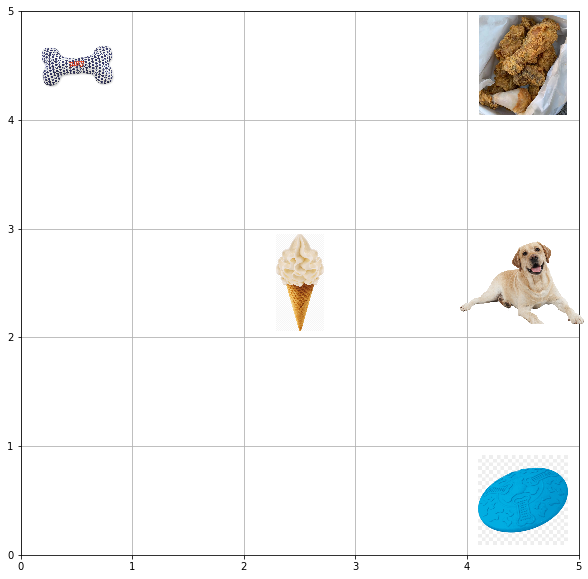

Info: Step: 112, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right'], 
 Current reward:0, 
 Total reward:40

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

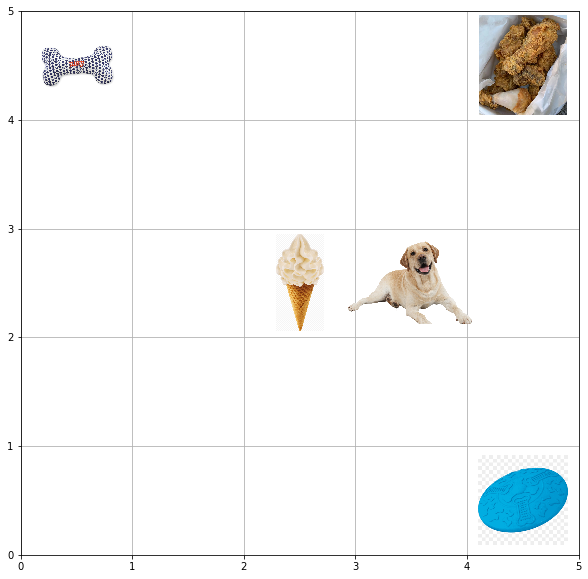

Info: Step: 113, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left'], 
 Current reward:0, 
 Total re

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

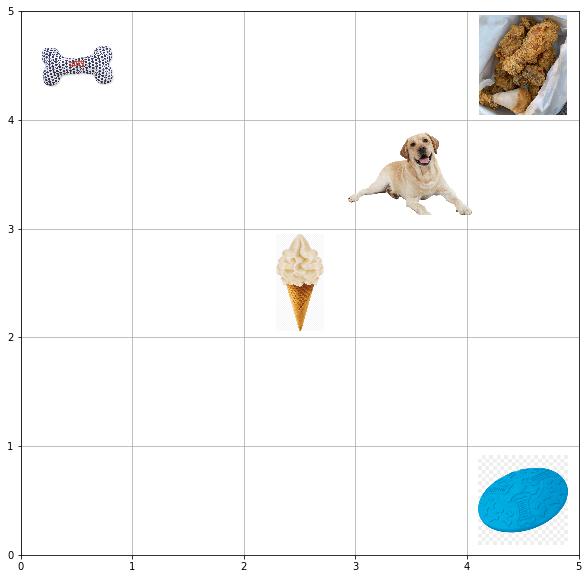

Info: Step: 114, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up'], 
 Current reward:0, 
 Tota

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

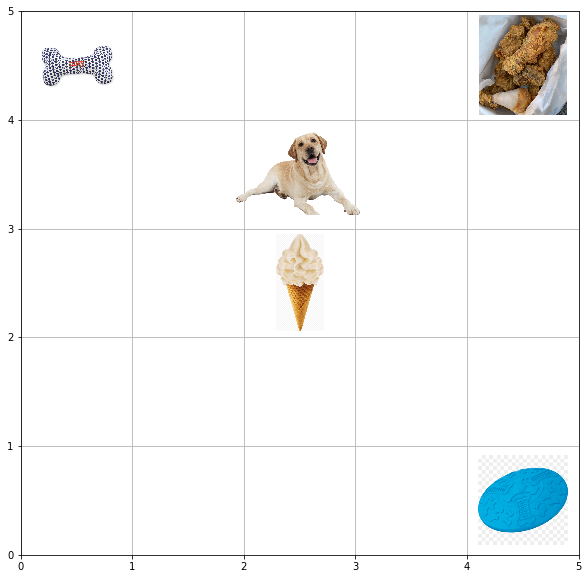

Info: Step: 115, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left'], 
 Current reward

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

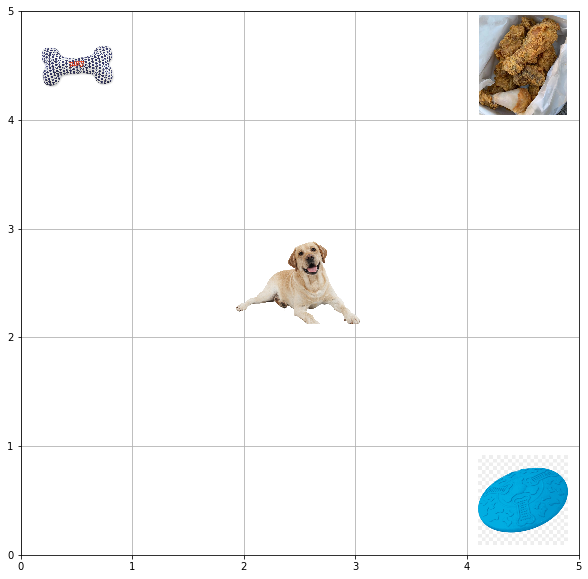

Info: Step: 116, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down'], 
 Curren

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

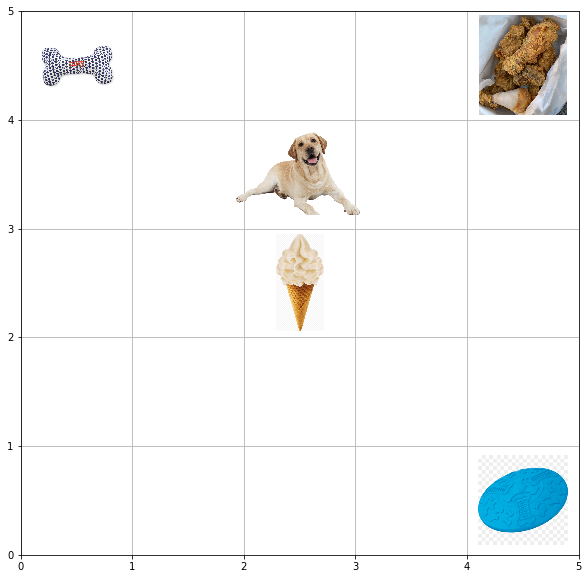

Info: Step: 117, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up'], 
 Cu

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

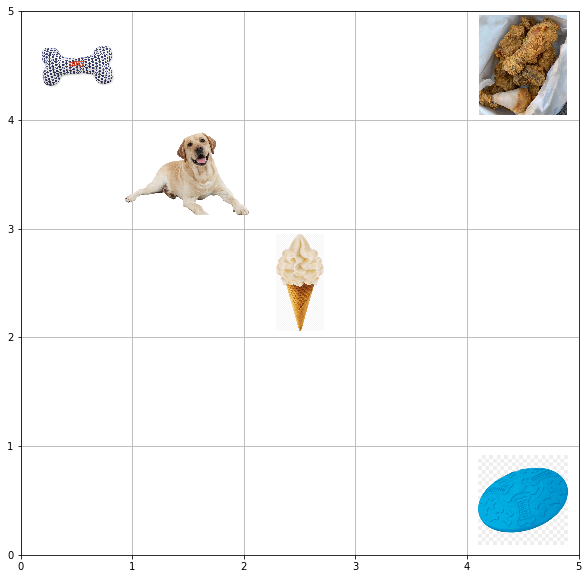

Info: Step: 118, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

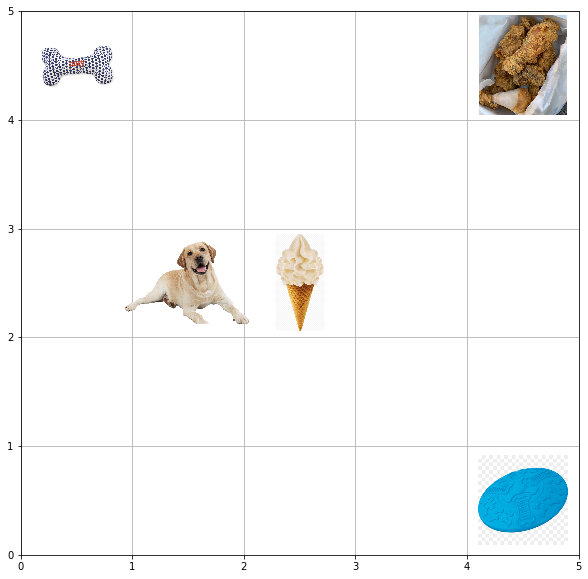

Info: Step: 119, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

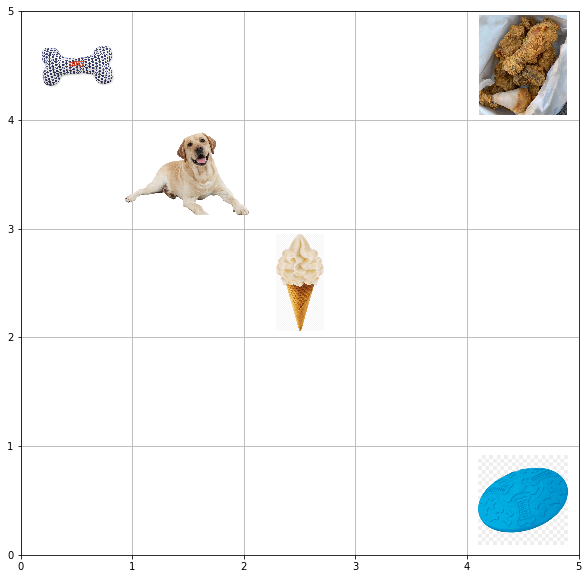

Info: Step: 120, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

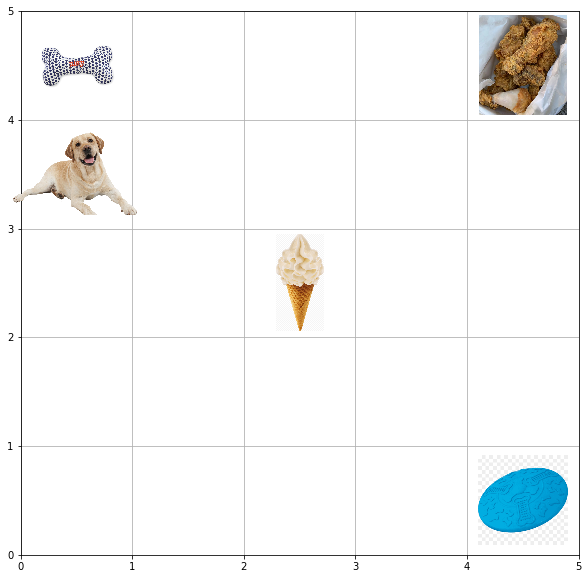

Info: Step: 121, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

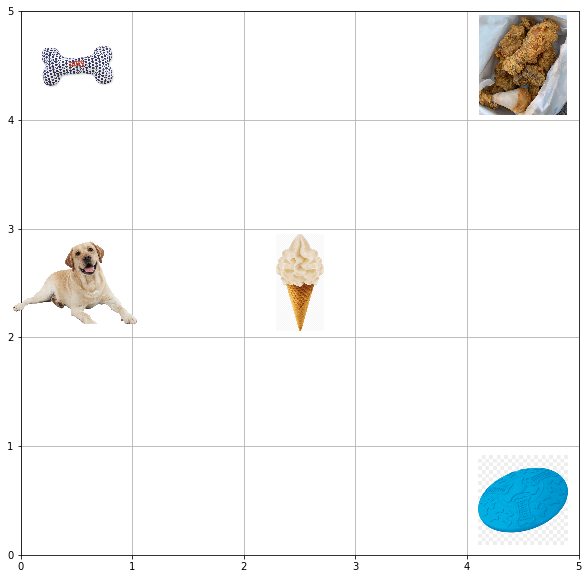

Info: Step: 122, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

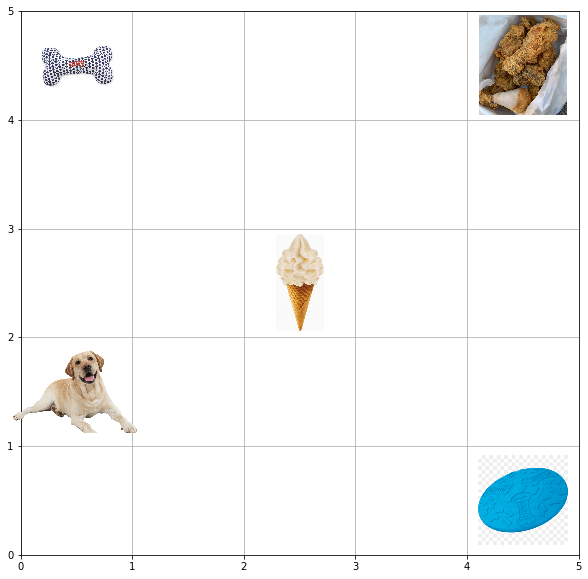

Info: Step: 123, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

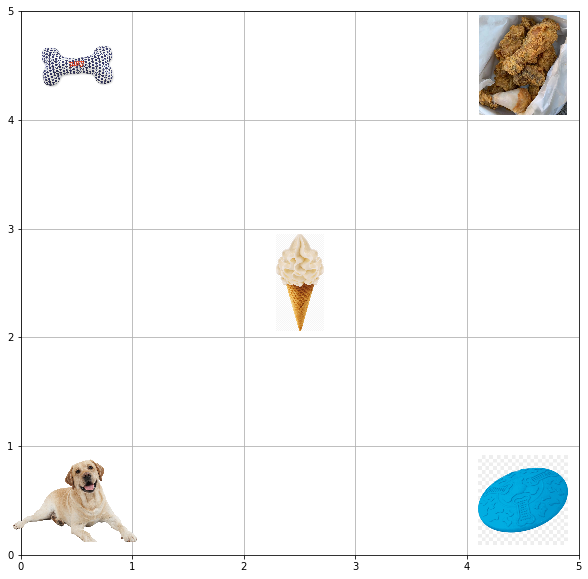

Info: Step: 124, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

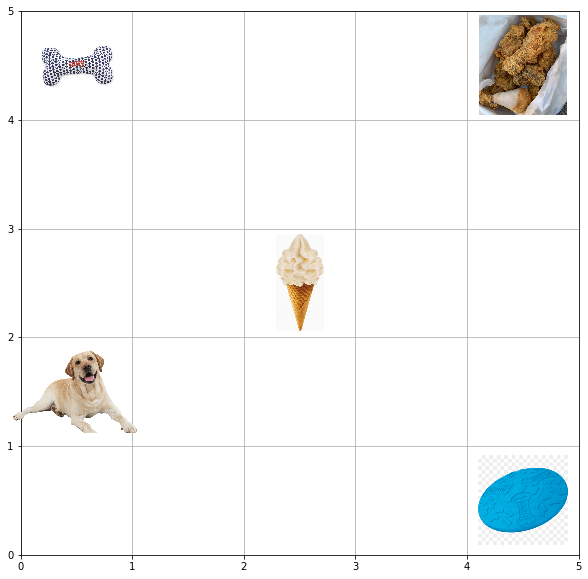

Info: Step: 125, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

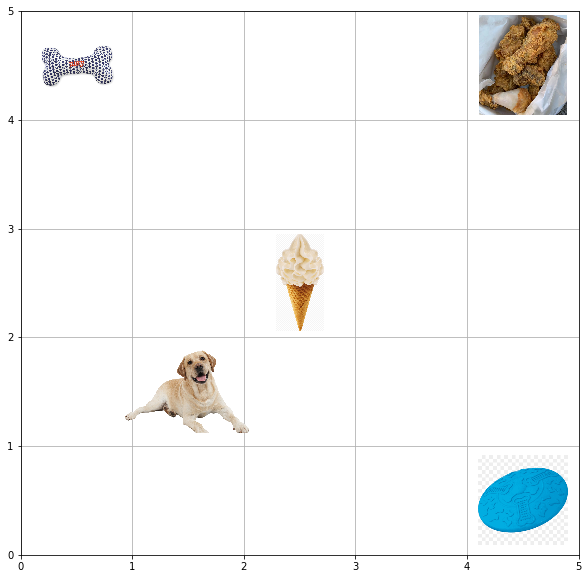

Info: Step: 126, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

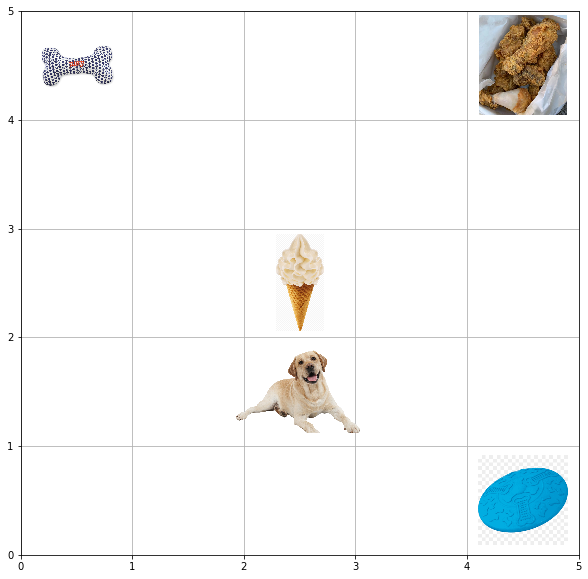

Info: Step: 127, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

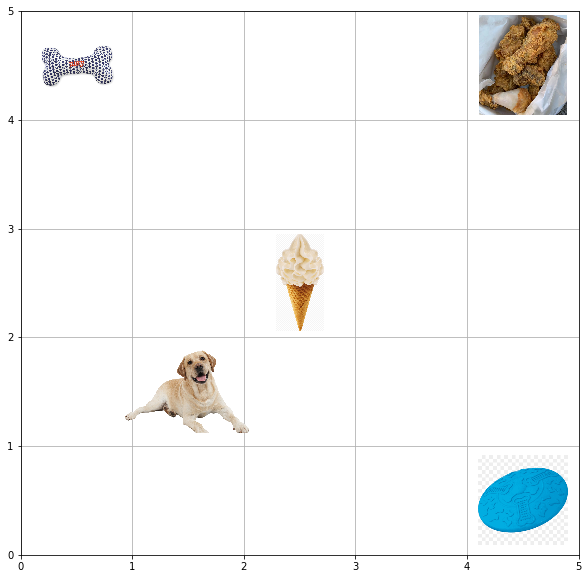

Info: Step: 128, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

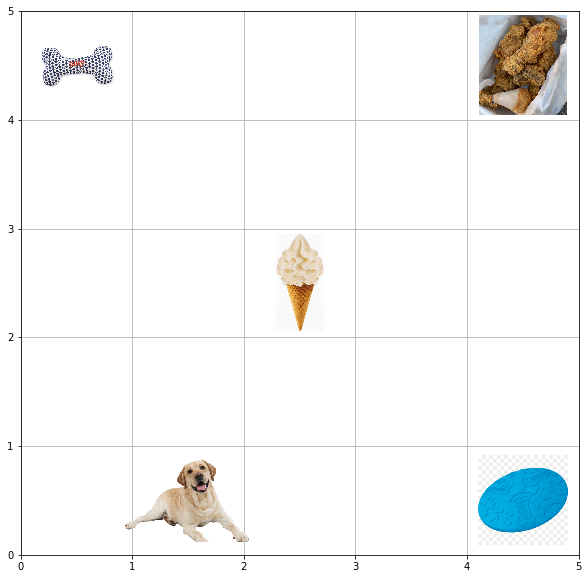

Info: Step: 129, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

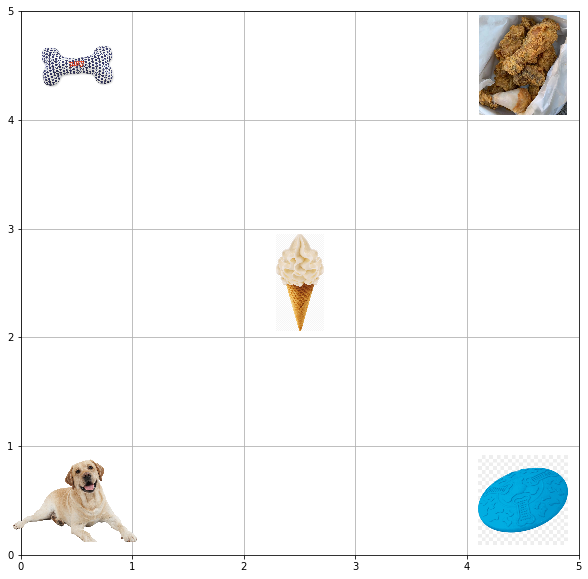

Info: Step: 130, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

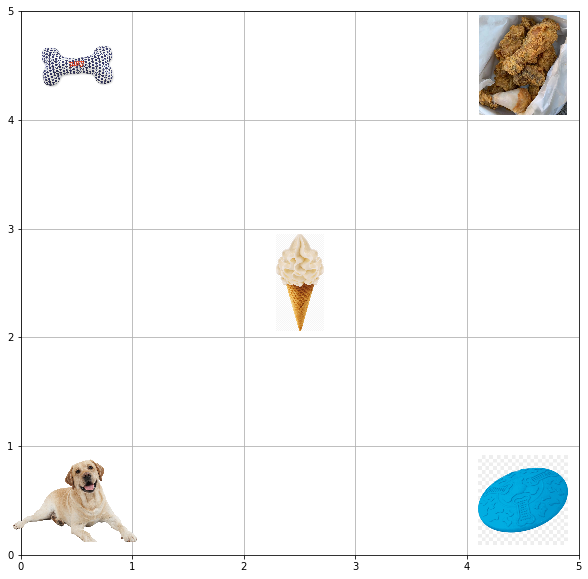

Info: Step: 131, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

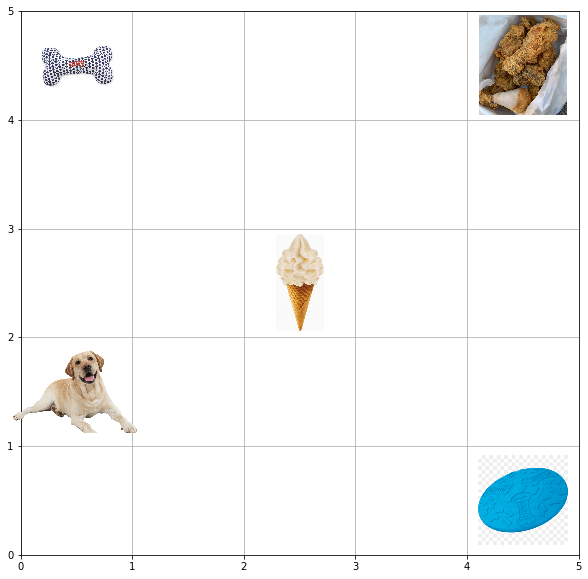

Info: Step: 132, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

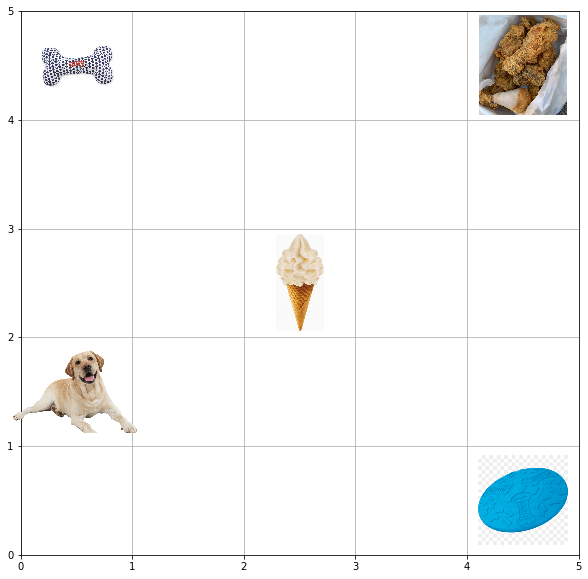

Info: Step: 133, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

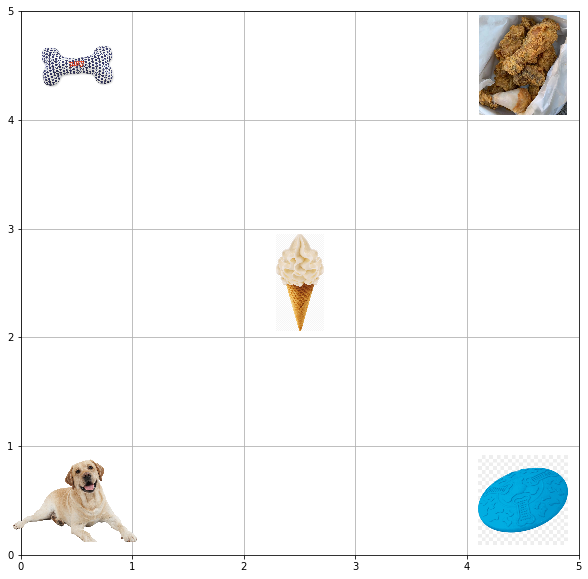

Info: Step: 134, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

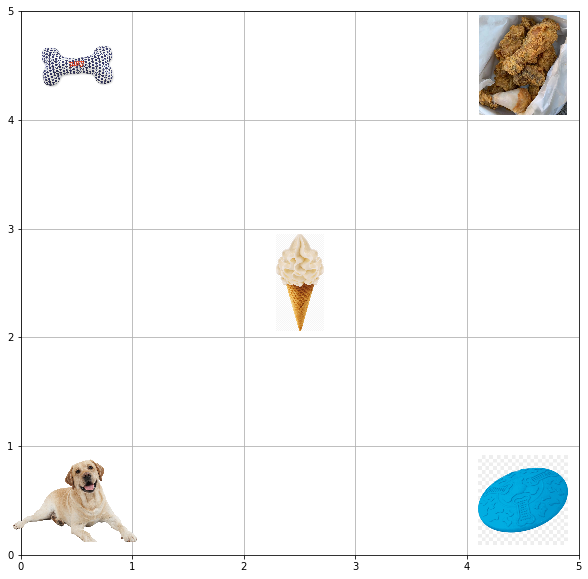

Info: Step: 135, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

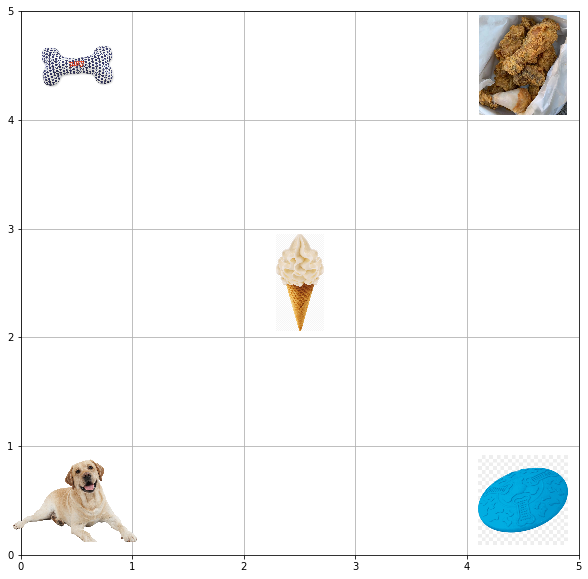

Info: Step: 136, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

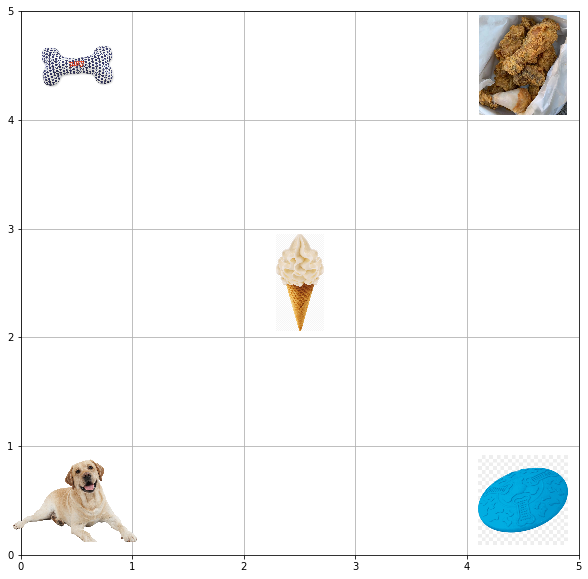

Info: Step: 137, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

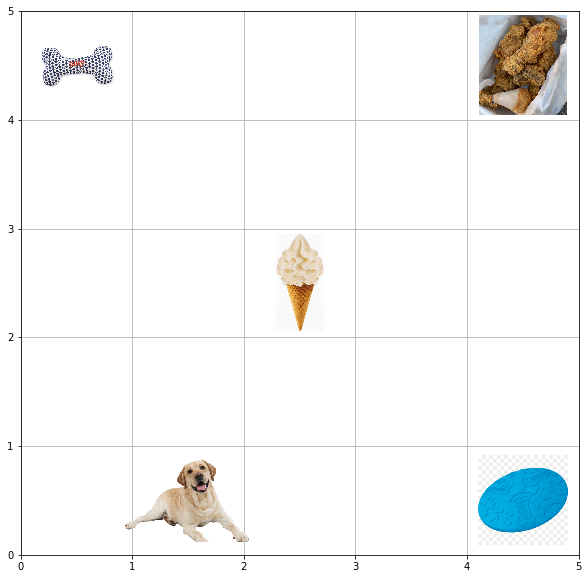

Info: Step: 138, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

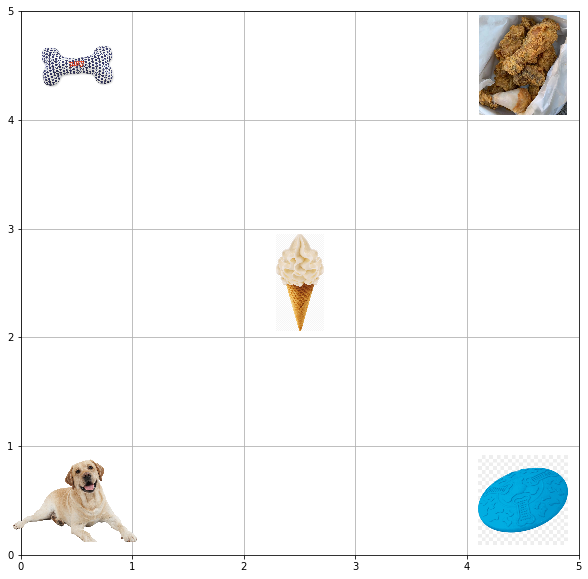

Info: Step: 139, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

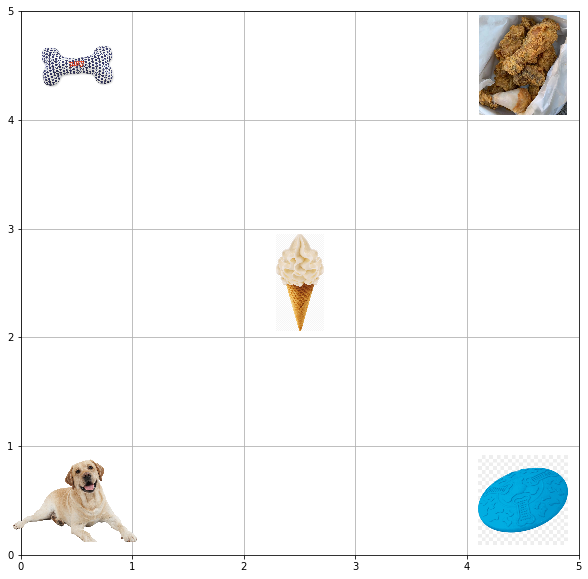

Info: Step: 140, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

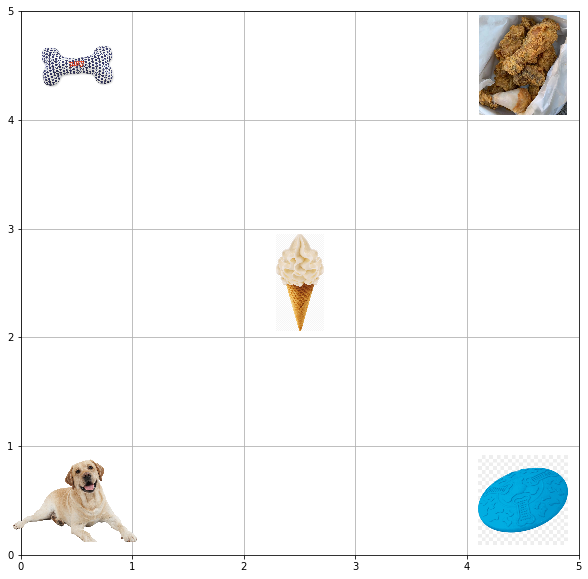

Info: Step: 141, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

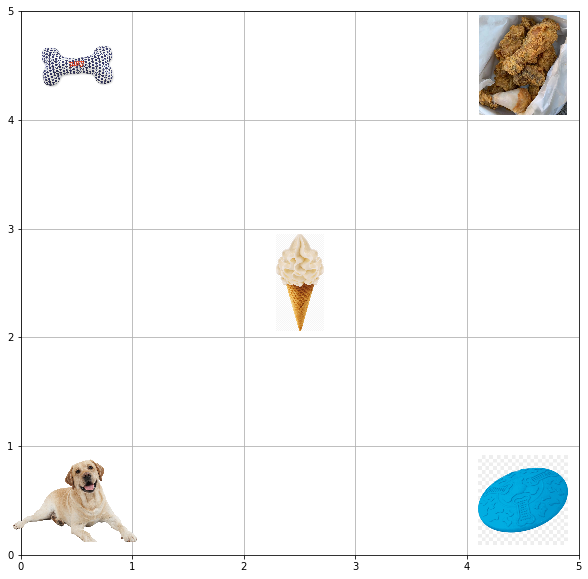

Info: Step: 142, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

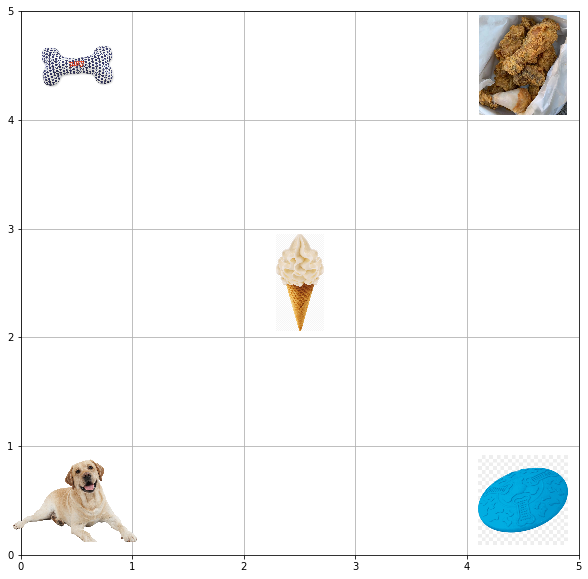

Info: Step: 143, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

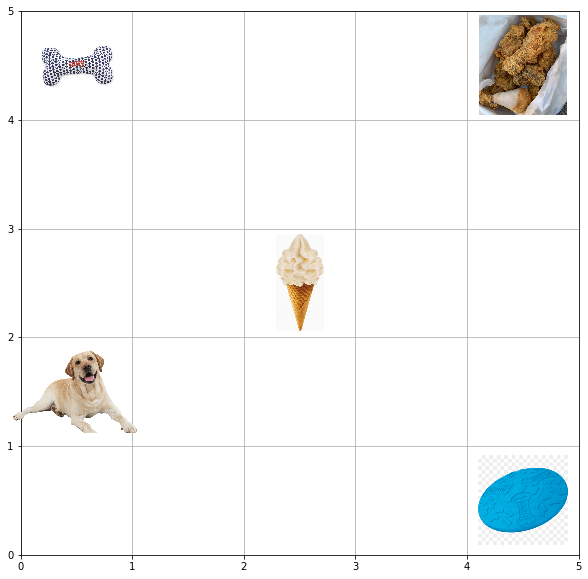

Info: Step: 144, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

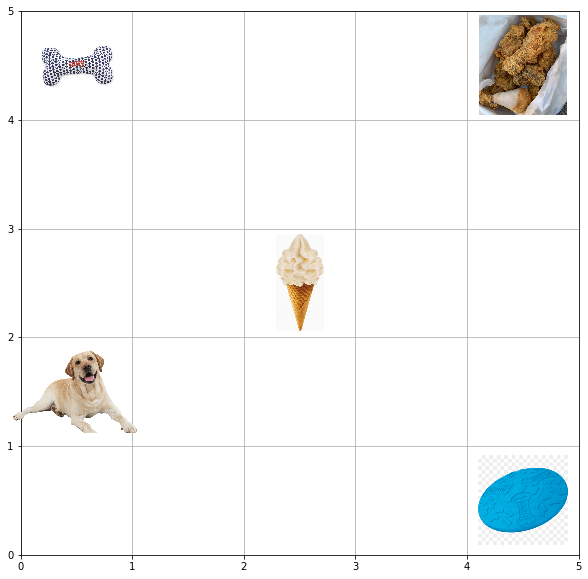

Info: Step: 145, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

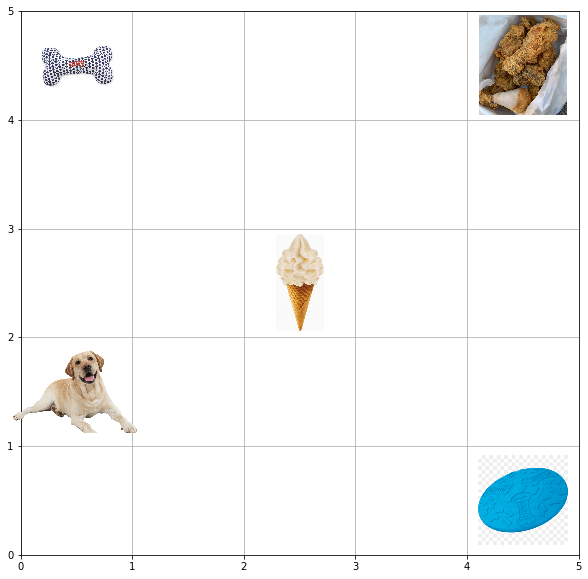

Info: Step: 146, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

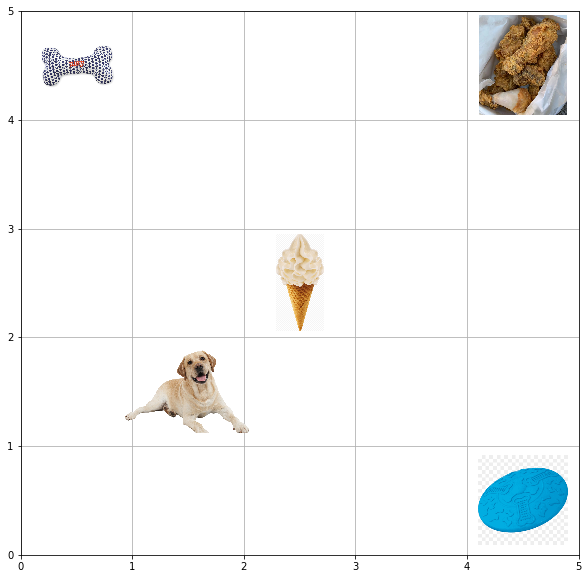

Info: Step: 147, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

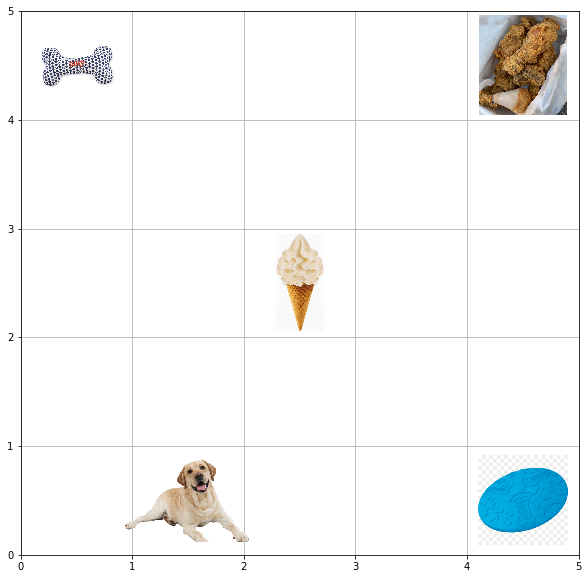

Info: Step: 148, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

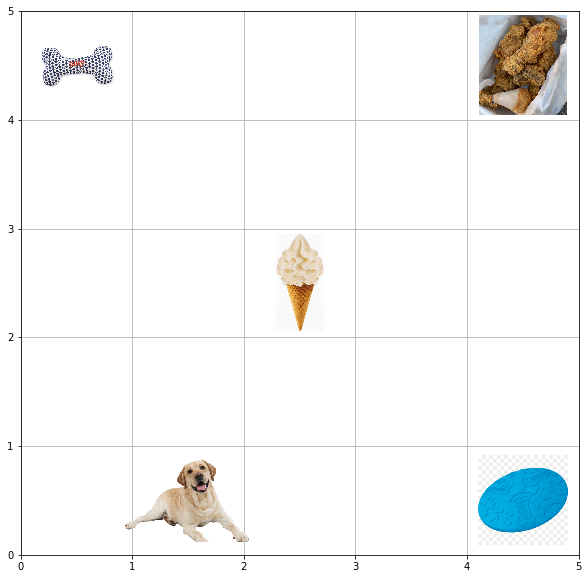

Info: Step: 149, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

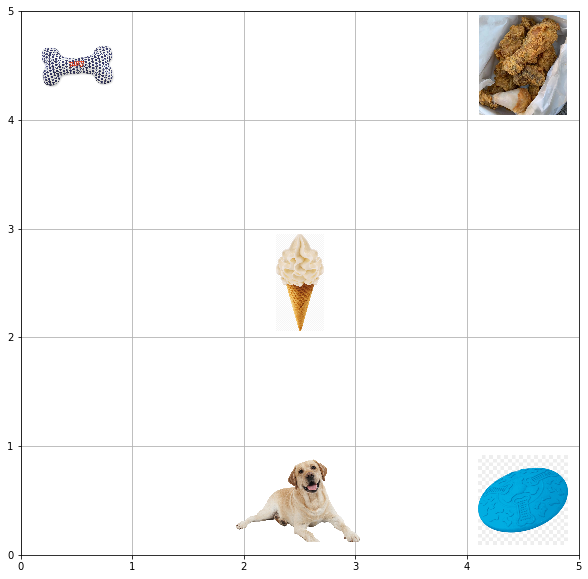

Info: Step: 150, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

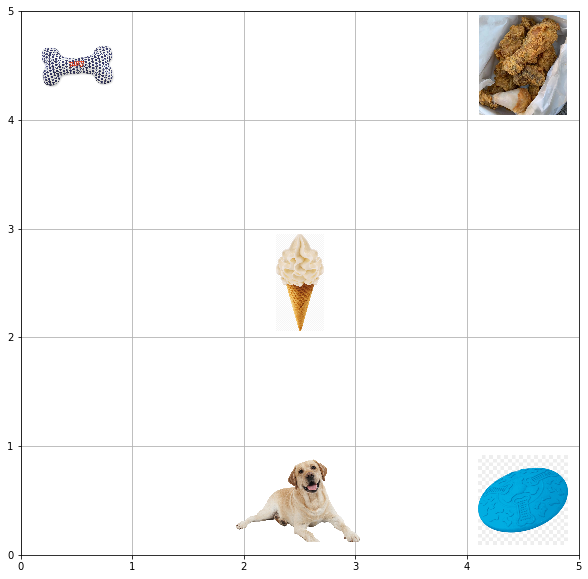

Info: Step: 151, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

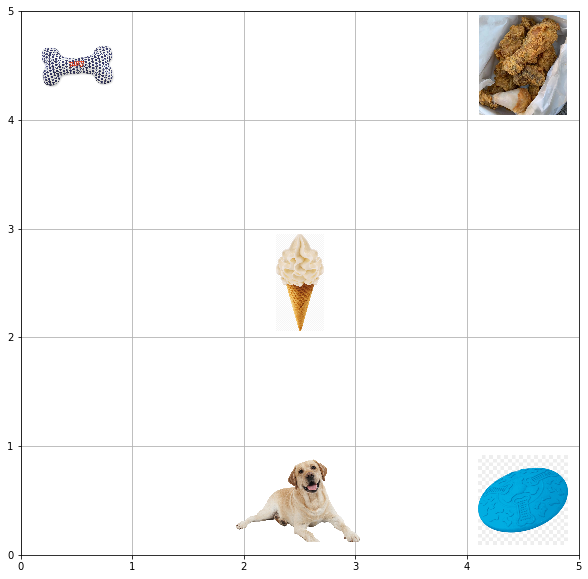

Info: Step: 152, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

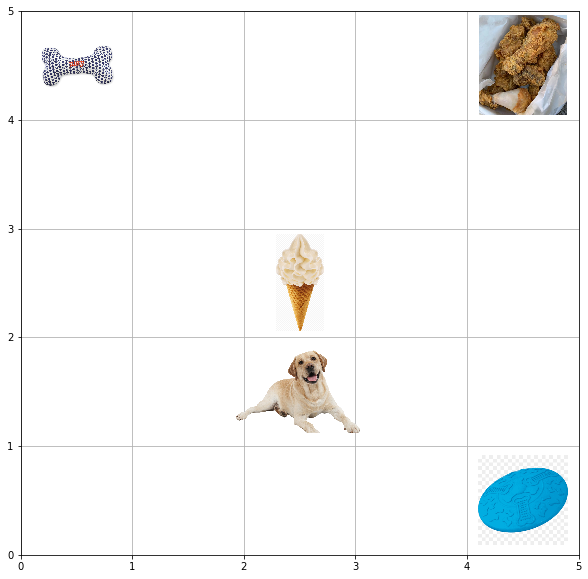

Info: Step: 153, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

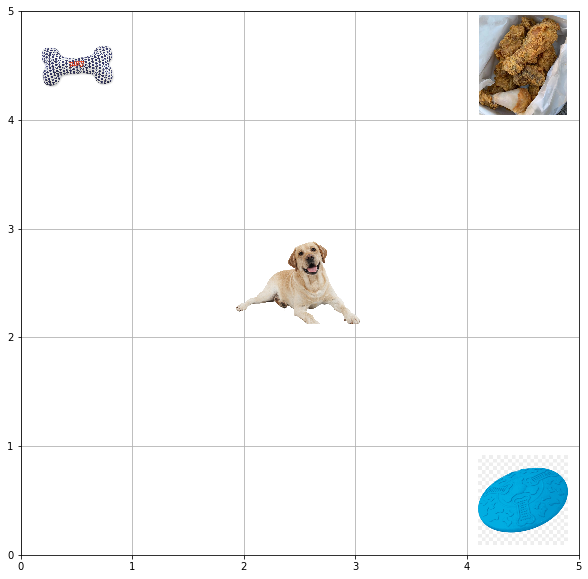

Info: Step: 154, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

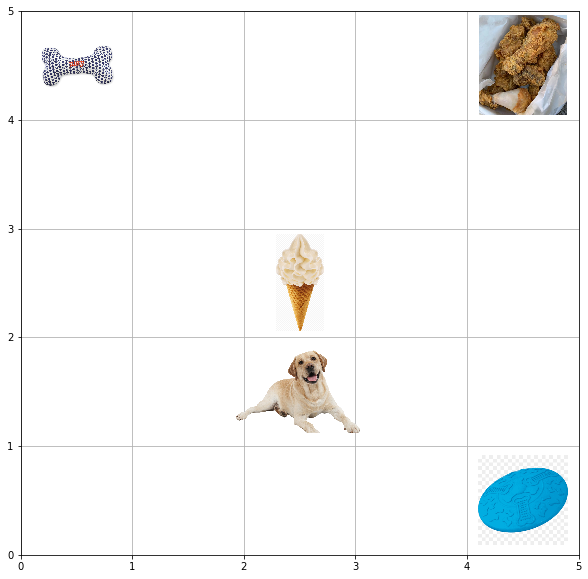

Info: Step: 155, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

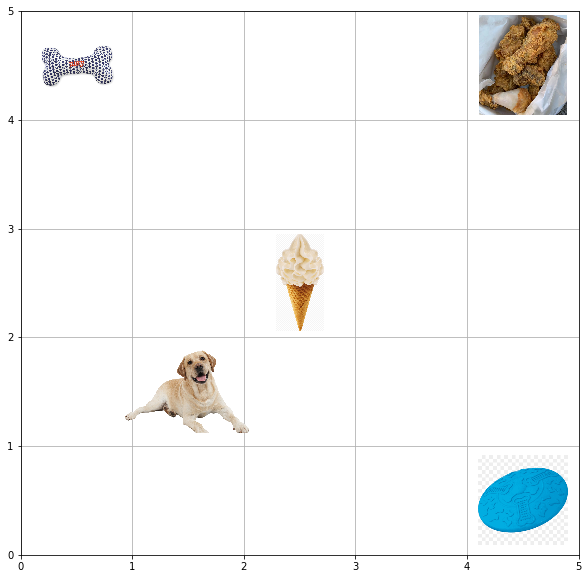

Info: Step: 156, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

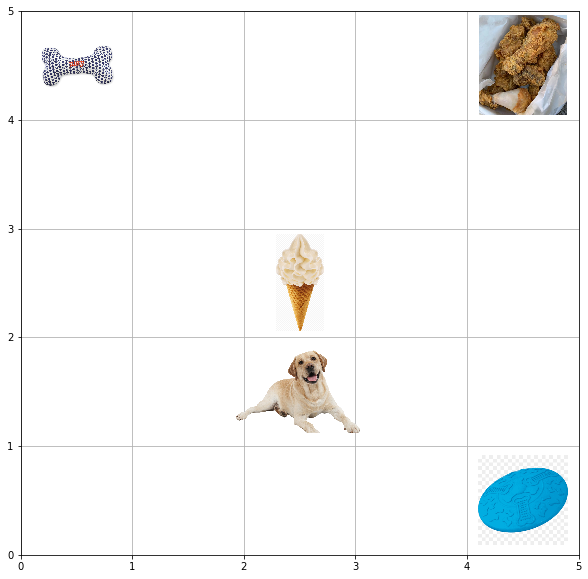

Info: Step: 157, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

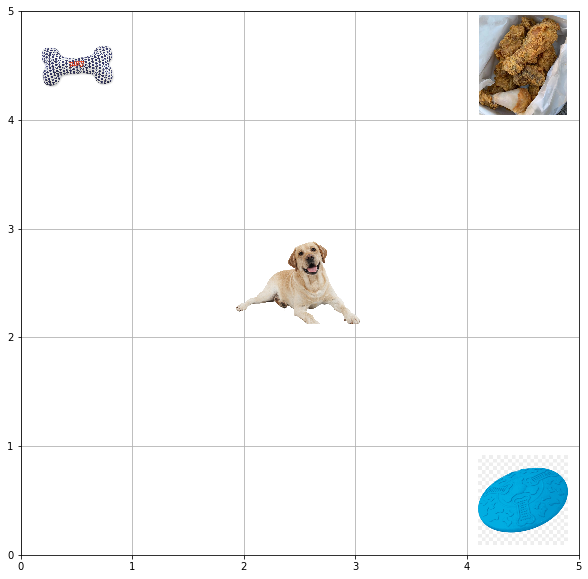

Info: Step: 158, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

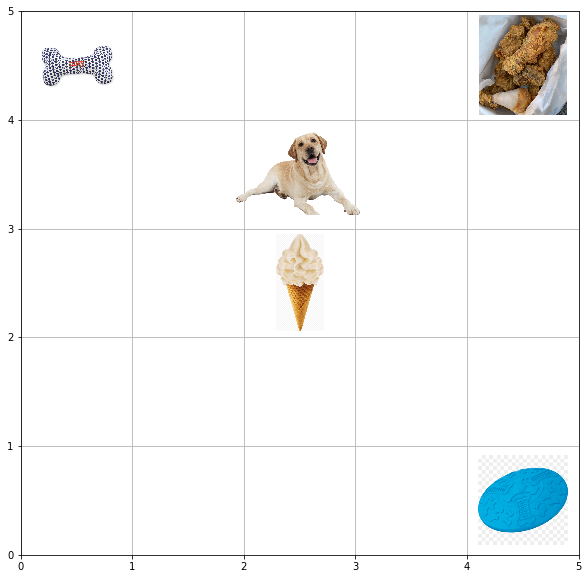

Info: Step: 159, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

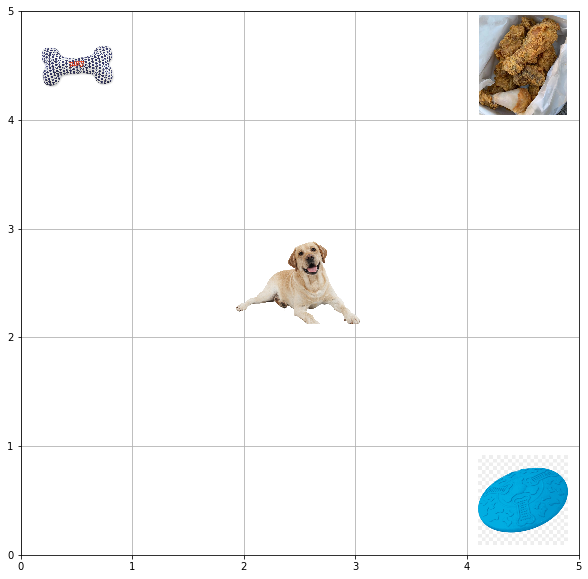

Info: Step: 160, 
 Current action:Down, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

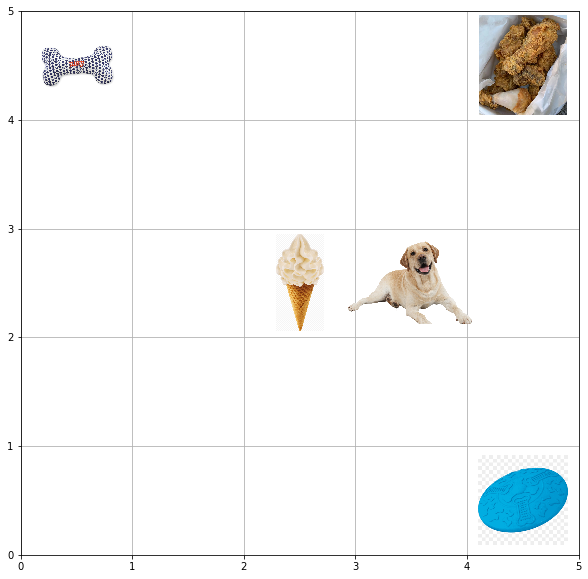

Info: Step: 161, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

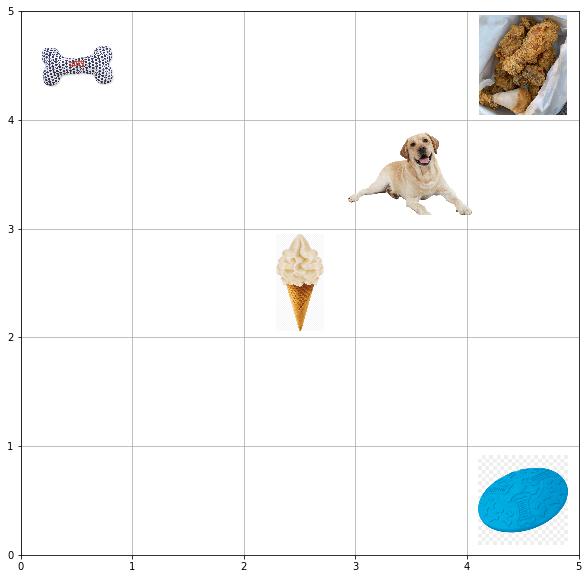

Info: Step: 162, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

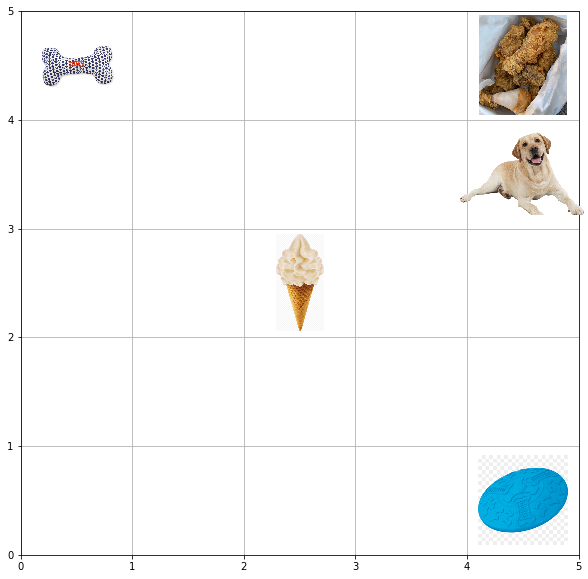

Info: Step: 163, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

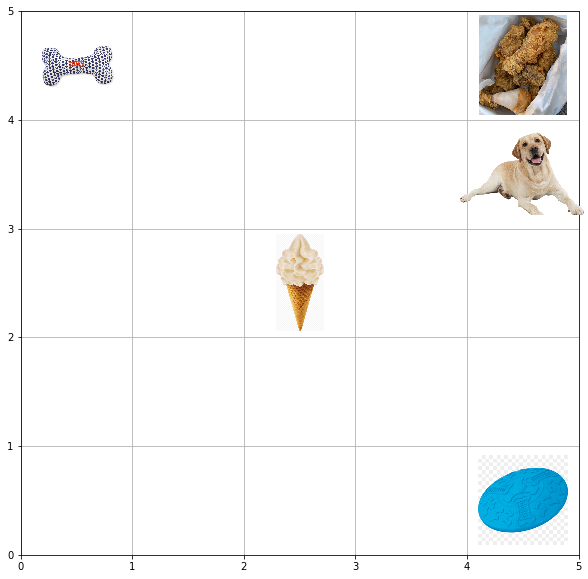

Info: Step: 164, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

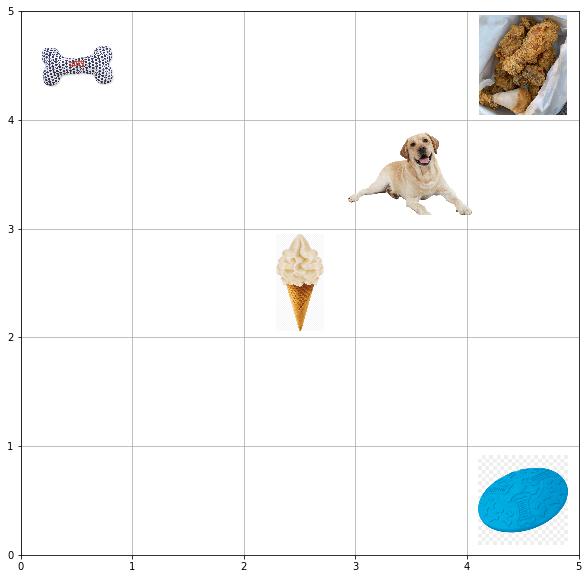

Info: Step: 165, 
 Current action:Left, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Le

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

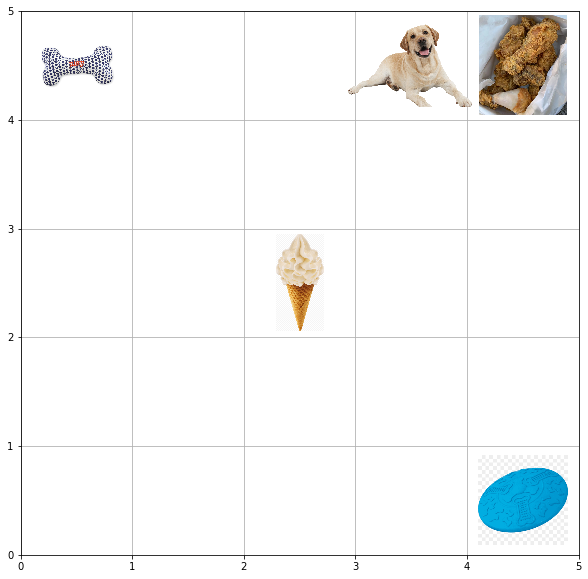

Info: Step: 166, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Left

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

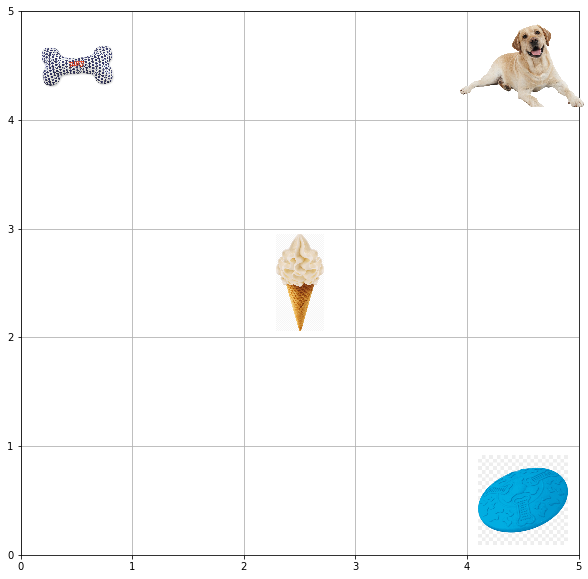

Info: Step: 167, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'L

<IPython.core.display.Javascript object>

In [6]:
env = GridEnvironment()
agent = Agent_Random_step(env)

env.reset()
done = False

history_reward = []
history_action = []
output_grid = widgets.Grid(1, 1)

while not done:
  
    action = agent.step()
    action,reward, done, info = env.step(action)
    with output_grid.output_to(0, 0):
        # output_grid.clear_cell()
      env.render()
      print('Info:', info)
      print('Done:', done)
      time.sleep(1)

reference: 
  class demo:
    4.19_spring22_cse574_cd_rl_random_agent.ipynb
    4.12_spring22_cse574_cd_RL_Env_Demo.ipynb

  GMT20220211-171652_recording_1920*1080.mp4


## Part 2 SARSA implimentation

In [7]:
# initialize the Q matrix where state * action  represent a state of ecah column for a different action
def get_model(env):
  action = env.action_space.n
  state = env.observation_space.n
  return np.zeros((state,action))

## greedy action
def greedy(Q_mat,state):
	if np.random.uniform(0, 1) < 0.8: # epsilon value
		return env.action_space.sample()
	else:
		return np.argmax(Q_mat[state, :])
	 

# Sarsa algorith to update action and state value 
def update_val(Q_mat,state, state2, reward, action, action2,learn_rate,gamma):

  Q_mat[state, action] = Q_mat[state, action] + learn_rate *(reward + gamma * Q_mat[state2,action2] - (Q_mat[state,action]))




In [8]:
## implementation of sarsa
def SARSA(eps, eps_decay, learn_rate,gamma,num_episodes):
  Q_mat = get_model(env)
  total_reward= 0
  final_reward = []
  eps_graph = []

  for i in range(num_episodes):
      state1 = env.reset()

      if eps > 0.01:
        eps = eps - eps_decay
        eps_graph.append(eps)
      
      action1 = greedy(Q_mat,state1)

      done = False
      ## loop until environment is stop
      while not done:
          state2, reward, done,info = env.step(action1)
          action2 = greedy(Q_mat,state2)

          ## sarsa algo
         
          update_val(Q_mat,state1, state2, reward, action1, action2,learn_rate, gamma)
        
          state1 = state2
          action1 = action2

          total_reward = total_reward + reward
          if done:
          
            with output_grid.output_to(0, 0):
              # output_grid.clear_cell()
              env.render()
              final_reward.append(total_reward)
              print('Info:', info)
              print('Done:', done)
              time.sleep(1)
  return Q_mat, final_reward, eps_graph, total_reward


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

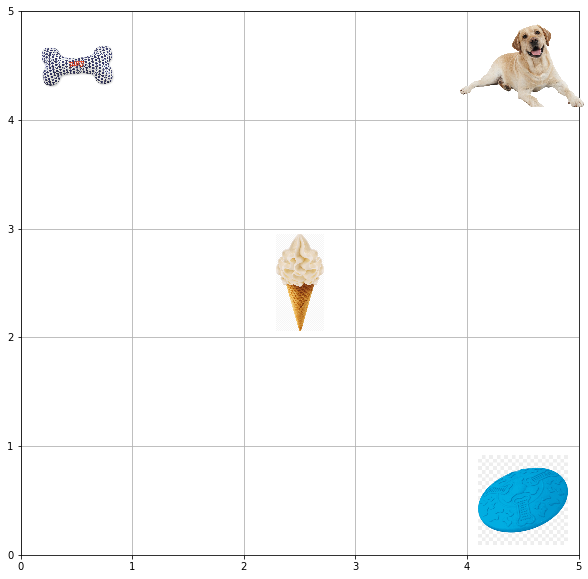

Info: Step: 1756, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

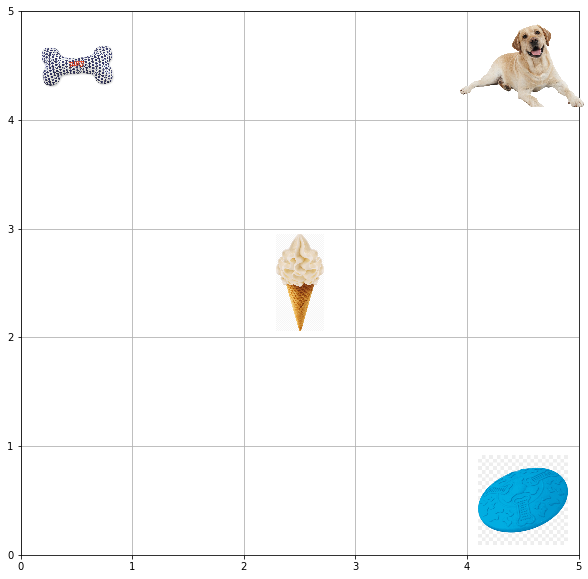

Info: Step: 1846, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

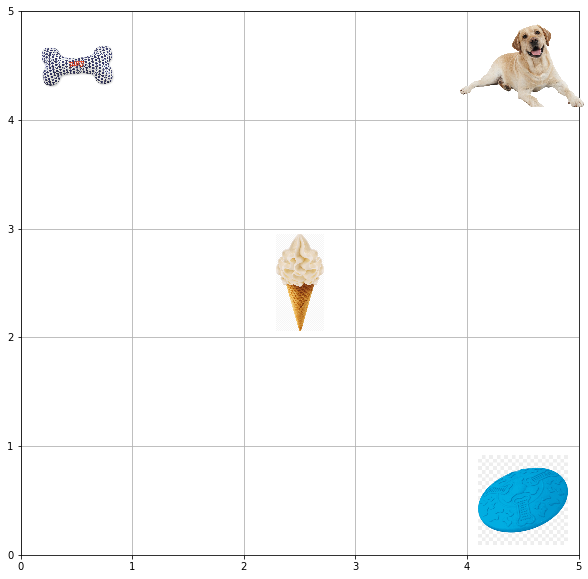

Info: Step: 1925, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Lef

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

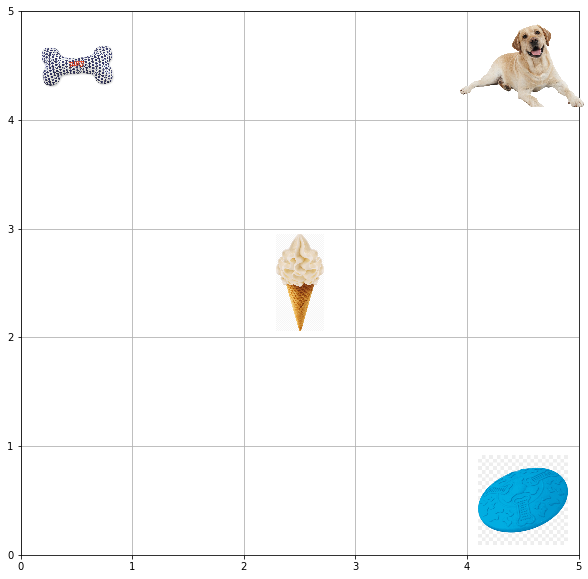

Info: Step: 1942, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Lef

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

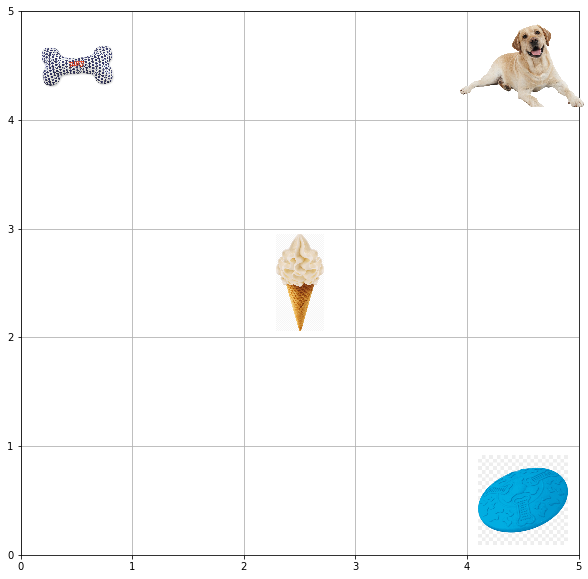

Info: Step: 1981, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

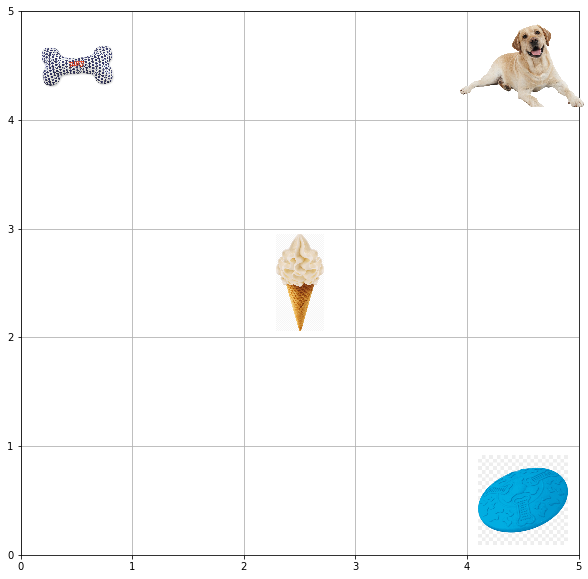

Info: Step: 1992, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Lef

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

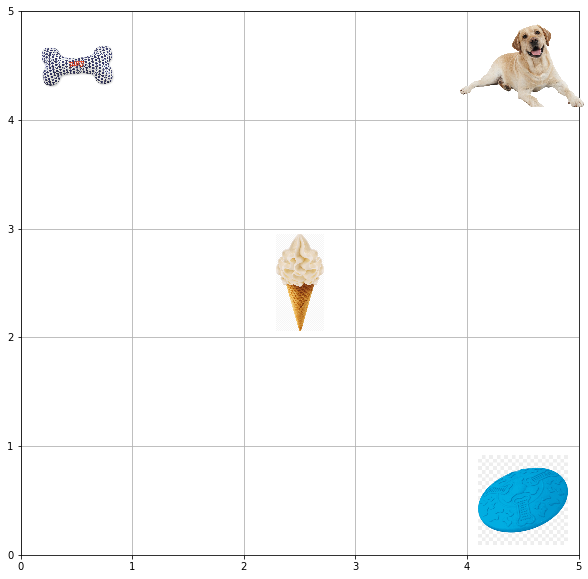

Info: Step: 2008, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

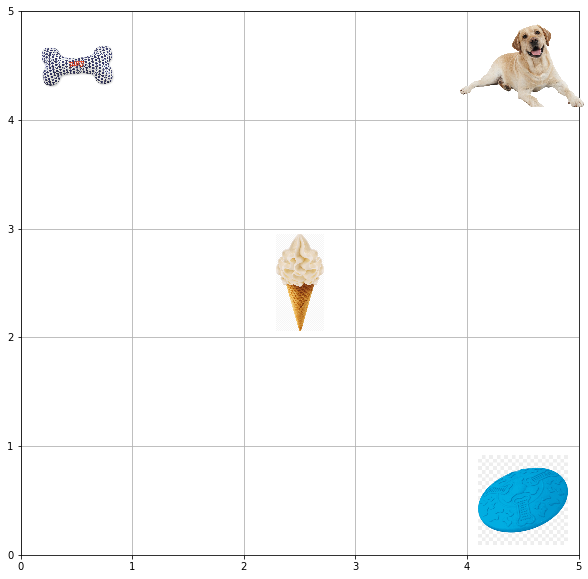

Info: Step: 2073, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

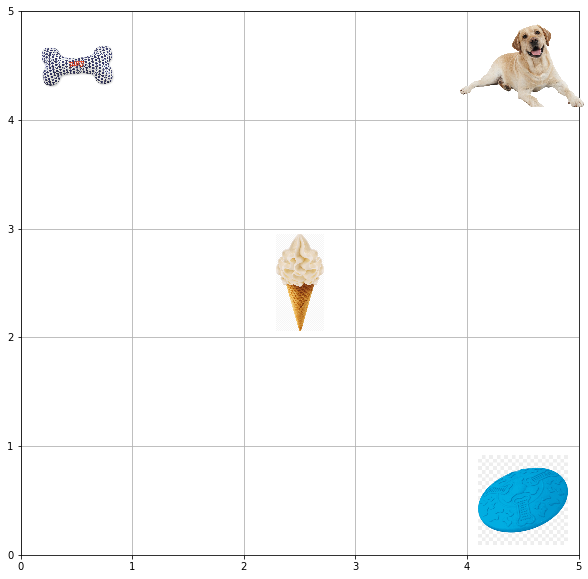

Info: Step: 2133, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

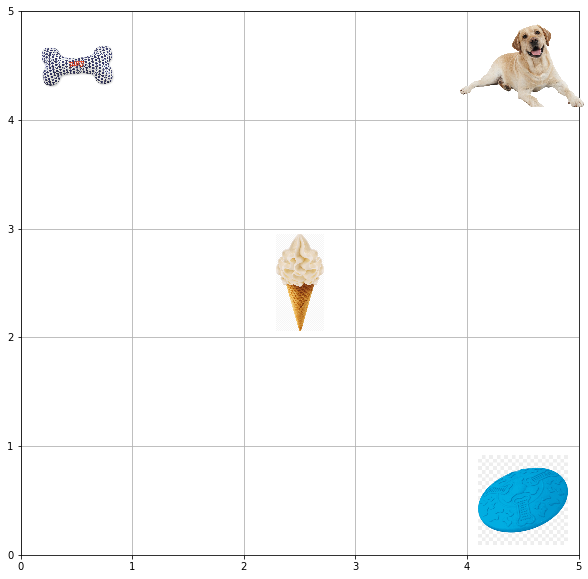

Info: Step: 2183, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

In [13]:
learn_rate = 0.01
gamma = 0.90
eps=0.3 
eps_decay=0.005
num_episodes=10
Q_mat, final_reward, eps_graph,total_reward = SARSA(eps, eps_decay, learn_rate,gamma,num_episodes)

#### Provide a plot for epsilon decay and the total reward per episode

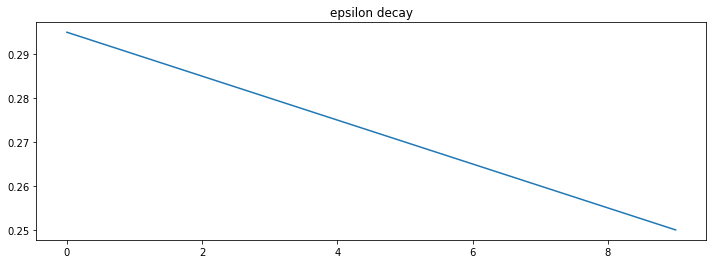

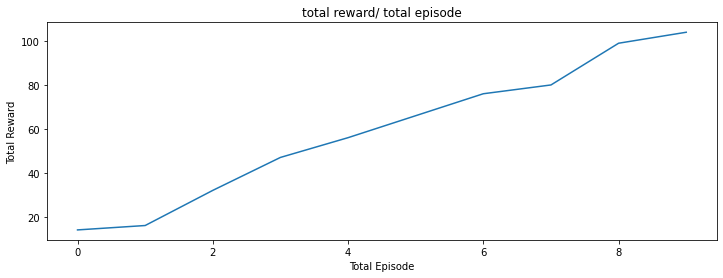

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (12, 4))
ax.set_title("epsilon decay")
pd.Series(eps_graph).plot(kind='line')
plt.show()

rewards_episode = [score / num_episodes for score in final_reward]
fig, ax = plt.subplots(figsize = (12, 4))
plt.xlabel("Total Episode")
plt.ylabel("Total Reward")
ax.set_title("total reward/ total episode")
pd.Series(rewards_episode).plot(kind='line')
plt.show()


In [15]:
performance = total_reward/num_episodes
print("performance of the Sarsa learnig:",performance)

performance of the Sarsa learnig: 104.0


In [16]:
# initialize the Q matrix where state * action  represent a state of ecah column for a different action
def get_model(env):
  action = env.action_space.n
  state = env.observation_space.n
  return np.zeros((state,action))

## greedy action
def greedy(Q_mat,state):
	if np.random.uniform(0, 1) < 0.5: # epsilon value
		return env.action_space.sample()
	else:
		return np.argmax(Q_mat[state, :])
	 

# Sarsa algorith to update action and state value 
def update_val(Q_mat,state, state2, reward, action, action2,learn_rate,gamma):

  Q_mat[state, action] = Q_mat[state, action] + learn_rate *(reward + gamma * Q_mat[state2,action2] - (Q_mat[state,action]))



In [17]:
## implementation of sarsa
def SARSA(eps, eps_decay, learn_rate,gamma,num_episodes):
  Q_mat = get_model(env)
  total_reward= 0
  final_reward = []
  eps_graph = []

  for i in range(num_episodes):
      state1 = env.reset()

      if eps > 0.01:
        eps = eps - eps_decay
        eps_graph.append(eps)
      
      action1 = greedy(Q_mat,state1)

      done = False
      ## loop until environment is stop
      while not done:
          state2, reward, done,info = env.step(action1)
          action2 = greedy(Q_mat,state2)

          ## sarsa algo
         
          update_val(Q_mat,state1, state2, reward, action1, action2,learn_rate, gamma)
        

          state1 = state2
          action1 = action2

          total_reward = total_reward + reward
          if done:
          

            with output_grid.output_to(0, 0):
              # output_grid.clear_cell()
              env.render()
              final_reward.append(total_reward)
              print('Info:', info)
              print('Done:', done)
              time.sleep(1)
  return Q_mat, final_reward, eps_graph, total_reward


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

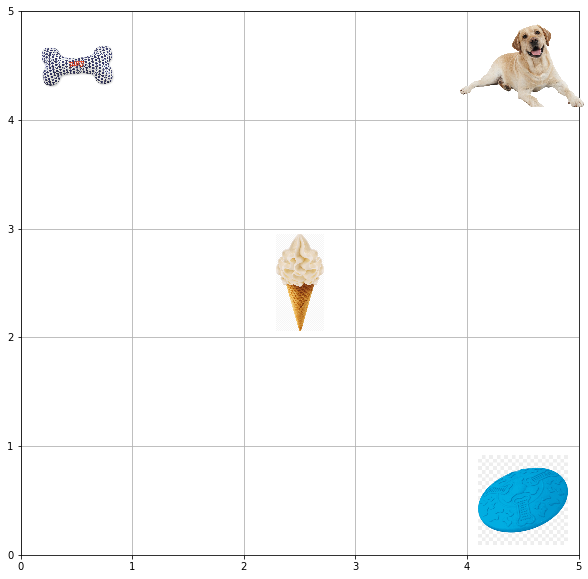

Info: Step: 2343, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Lef

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

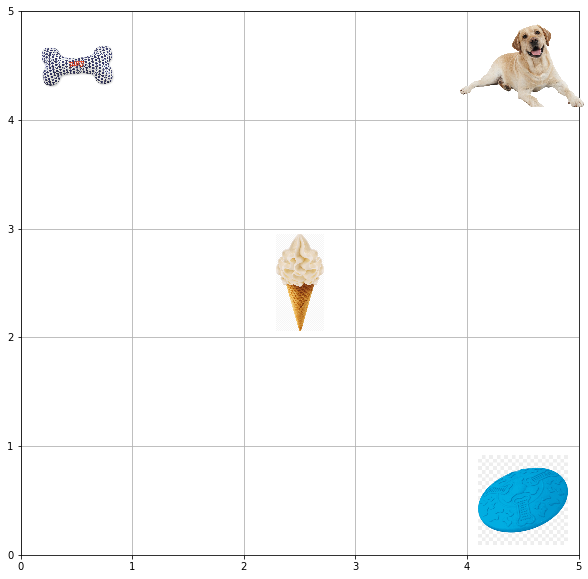

Info: Step: 2361, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Lef

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

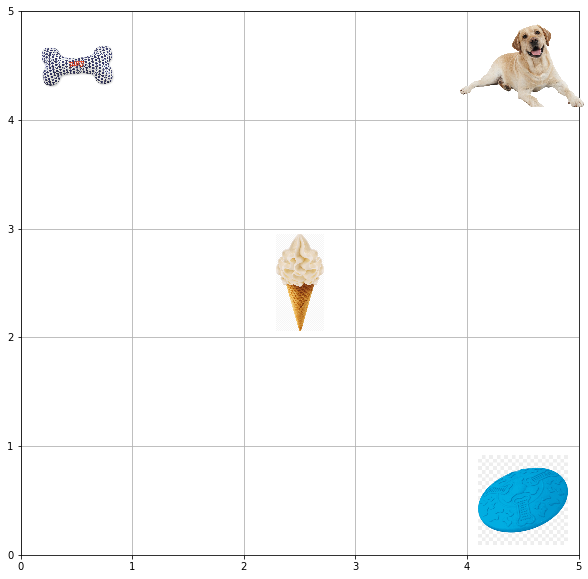

Info: Step: 2422, 
 Current action:Up, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', 'Lef

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

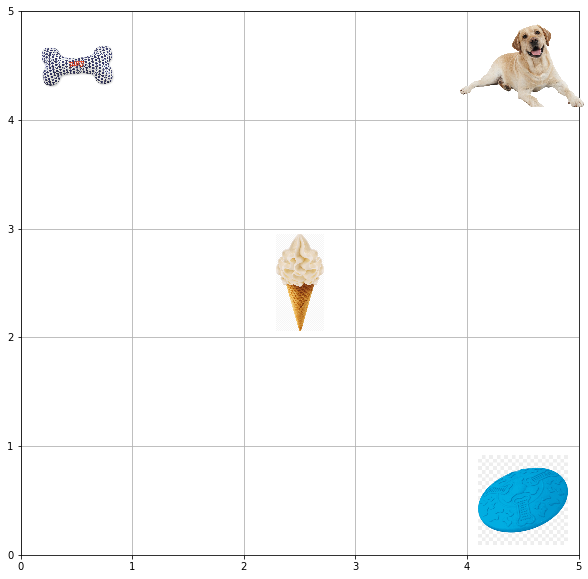

Info: Step: 2556, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

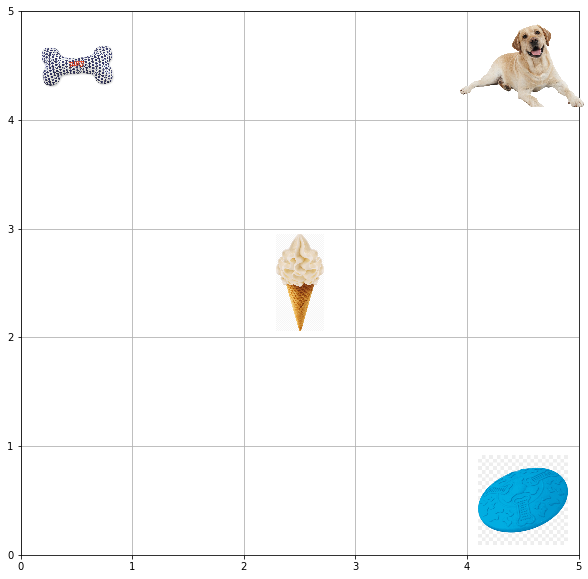

Info: Step: 2568, 
 Current action:Right, 
 History Action(including current action):['Left', 'Up', 'Up', 'Left', 'Down', 'Left', 'Left', 'Down', 'Left', 'Up', 'Down', 'Left', 'Right', 'Left', 'Down', 'Down', 'Up', 'Down', 'Left', 'Up', 'Up', 'Up', 'Down', 'Down', 'Left', 'Up', 'Right', 'Left', 'Up', 'Up', 'Down', 'Right', 'Right', 'Right', 'Left', 'Right', 'Left', 'Right', 'Right', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Up', 'Left', 'Left', 'Right', 'Down', 'Up', 'Up', 'Down', 'Left', 'Left', 'Right', 'Down', 'Left', 'Down', 'Right', 'Left', 'Left', 'Right', 'Down', 'Up', 'Right', 'Right', 'Down', 'Right', 'Right', 'Up', 'Left', 'Right', 'Left', 'Up', 'Right', 'Down', 'Right', 'Down', 'Left', 'Right', 'Down', 'Left', 'Left', 'Right', 'Down', 'Up', 'Left', 'Up', 'Down', 'Up', 'Right', 'Down', 'Up', 'Down', 'Left', 'Down', 'Left', 'Up', 'Right', 'Left', 'Right', 'Up', 'Down', 'Down', 'Right', 'Left', 'Right', 'Up', 'Up', 'Right', 'Left', 'Up', 'Left', 'Down', 'Up', '

<IPython.core.display.Javascript object>

In [19]:
learn_rate = 0.01
gamma = 0.90
eps=0.5 
eps_decay=0.009
num_episodes=5
Q_mat, final_reward, eps_graph,total_reward = SARSA(eps, eps_decay, learn_rate,gamma,num_episodes)

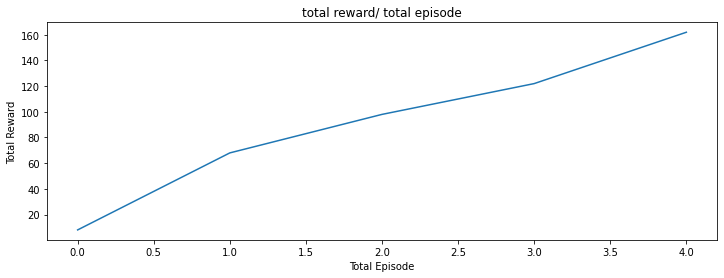

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

rewards_episode = [score / num_episodes for score in final_reward]
fig, ax = plt.subplots(figsize = (12, 4))
plt.xlabel("Total Episode")
plt.ylabel("Total Reward")
ax.set_title("total reward/ total episode")
pd.Series(rewards_episode).plot(kind='line')
plt.show()

In [21]:
performance = total_reward/num_episodes
print("performance of the Sarsa learnig:",performance)

performance of the Sarsa learnig: 162.0


###  Reference

- https://www.martinholub.com/eth/code/2018/07/14/ReinforcementLearning.html
- https://github.com/dennybritz/reinforcement-learning/blob/master/lib/envs/gridworld.py
- https://github.com/sudharsan13296/Deep-Reinforcement-Learning-With-Python/tree/master/01.%20Fundamentals%20of%20Reinforcement%20Learning
- https://www.geeksforgeeks.org/sarsa-reinforcement-learning/
- https://medium.com/analytics-vidhya/grid-a-grid-world-environment-based-on-openai-gym-725189dcada6
- https://python.hotexamples.com/examples/gridworld/GridWorld/-/python-gridworld-class-examples.html
- https://github.com/sudharsan13296/Deep-Reinforcement-Learning-With-Python
- https://towardsdatascience.com/reinforcement-learning-implement-grid-world-from-scratch-c5963765ebff
- https://cs.stanford.edu/people/karpathy/reinforcejs/gridworld_dp.html
- https://courses.cs.washington.edu/courses/cse473/18wi/assignments/project3/project.html
- https://tcnguyen.github.io/reinforcement_learning/sarsa_vs_q_learning.html
- https://www.baeldung.com/cs/epsilon-greedy-q-learning